In [1]:
#%load_ext pycodestyle_magic
#%pycodestyle_on
#pip install flake8 pycodestyle_magic
#%pycodestyle_off

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None )
#pd.set_option('display.max_rows', None )
from el_myfuction import *
from ACP_KMEANS_functions import *
from kmodes.kprototypes import KPrototypes

# premier test cluster

In [2]:
data_test = pd.read_csv('data_modelisation_cut.csv', index_col=0)


In [3]:
data_test.isna().sum()

geolocation_lat            238
geolocation_lng            238
prix_par_commande            0
livraison_par_commande       0
paye_par_commande            0
nb_paye_par_commande         0
nb_commande                  0
date_derniere_commande       0
note_par_commande            0
delai                     2440
main_categ_count_en          0
main_categ_price_en          0
date_commande                0
heure_commande               0
delai_jours               2440
dtype: int64

In [4]:
# ona va utiliser les delais de livraisons et geolocalisation
data_test.dropna(inplace=True)

In [5]:
data_test

,geolocation_lat,geolocation_lng,prix_par_commande,livraison_par_commande,paye_par_commande,nb_paye_par_commande,nb_commande,date_derniere_commande,note_par_commande,delai,main_categ_count_en,main_categ_price_en,date_commande,heure_commande,delai_jours
0,-20.498489,-47.396929,124.99,21.88,146.87,2,1,2017-05-16 15:05:35,4,8 days 19:30:00,office_furniture,office_furniture,17302.0,54335,8.812500
1,-23.727992,-46.542848,289.00,46.48,335.48,8,1,2018-01-12 20:48:24,5,16 days 15:52:55,housewares,housewares,17543.0,74904,16.661748
2,-23.531642,-46.656289,139.94,17.79,157.73,7,1,2018-05-19 16:07:45,5,26 days 01:51:06,office_furniture,office_furniture,17670.0,58065,26.077153
3,-23.499702,-46.185233,149.94,23.36,173.30,1,1,2018-03-13 16:06:38,5,14 days 23:57:47,office_furniture,office_furniture,17603.0,57998,14.998461
4,-22.975100,-47.142925,230.00,22.25,252.25,8,1,2018-07-29 09:51:30,5,11 days 11:04:18,home_confort,home_confort,17741.0,35490,11.461319
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99434,-23.370879,-46.847968,124.90,7.74,132.64,1,1,2018-05-18 21:42:33,4,17 days 21:50:51,watches_gifts,watches_gifts,17669.0,78153,17.910312
99435,-20.140360,-44.884080,55.00,20.88,75.88,1,1,2017-12-17 23:13:41,1,17 days 13:54:24,housewares,housewares,17517.0,83621,17.579444
99436,-23.586003,-46.499638,74.90,13.88,88.78,6,1,2018-04-07 15:48:17,4,6 days 04:18:20,books_general_interest,books_general_interest,17628.0,56897,6.179398
99437,-23.615830,-46.768533,114.90,14.16,129.06,3,1,2018-04-04 08:20:22,5,7 days 10:34:23,sports_leisure,sports_leisure,17625.0,30022,7.440544


In [6]:
data_test.date_derniere_commande=pd.to_datetime(data_test.date_derniere_commande)
data_test.delai=pd.to_timedelta(data_test.delai)

# on commence avec les trimestres

In [58]:
filter_date = (data_test.date_derniere_commande>pd.to_datetime('2017-01-01')) &  (data_test.date_derniere_commande<pd.to_datetime('2017-07-01')) 
df_trim = data_test[filter_date].copy()

In [59]:
df_trim

,geolocation_lat,geolocation_lng,prix_par_commande,livraison_par_commande,paye_par_commande,nb_paye_par_commande,nb_commande,date_derniere_commande,note_par_commande,delai,main_categ_count_en,main_categ_price_en,date_commande,heure_commande,delai_jours
0,-20.498489,-47.396929,124.990,21.880,146.87,2,1,2017-05-16 15:05:35,4,8 days 19:30:00,office_furniture,office_furniture,17302.0,54335,8.812500
21,-23.560949,-46.688422,89.900,12.130,102.03,2,1,2017-05-11 13:48:47,3,26 days 22:13:27,bed_bath_table,bed_bath_table,17297.0,49727,26.926007
26,-25.417946,-49.206790,79.900,14.730,94.63,1,1,2017-04-14 11:24:56,5,6 days 05:39:55,baby,baby,17270.0,41096,6.236053
30,-23.604780,-46.693559,29.990,17.600,47.59,1,1,2017-05-15 17:58:25,3,3 days 17:11:46,kitchen_dining_laundry_garden_furniture,kitchen_dining_laundry_garden_furniture,17301.0,64705,3.716505
37,-22.479458,-44.497006,168.925,49.965,218.89,8,2,2017-06-14 18:52:29,5,16 days 08:11:00.500000,bed_bath_table,bed_bath_table,17331.0,67949,16.340978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99420,-21.341162,-43.377558,49.900,14.520,64.42,1,1,2017-01-25 16:51:27,1,13 days 15:47:22,fashion_bags_accessories,fashion_bags_accessories,17191.0,60687,13.657894
99424,-23.530801,-46.335356,89.900,12.130,102.03,1,1,2017-05-15 17:42:38,1,6 days 20:32:07,home_confort,home_confort,17301.0,63758,6.855637
99428,-22.769600,-47.150402,110.000,20.850,130.85,1,1,2017-03-27 16:26:18,4,7 days 21:31:35,furniture_decor,furniture_decor,17252.0,59178,7.896933
99430,-23.673541,-47.023418,89.900,12.130,102.03,1,1,2017-05-24 11:54:31,5,9 days 02:18:07,bed_bath_table,bed_bath_table,17310.0,42871,9.095914


In [60]:
# la date est plus comprehensible
df_trim.date_commande = df_trim.date_commande.max() - df_trim.date_commande

## Score RFM

In [61]:
def cal_quantile(col):
    '''
    Input : colonne a quantifier
    output : valeur RFM pour la colonne
    '''
    df = pd.DataFrame(col)
    quantil25 = col.quantile(q=0.25)
    quantil50 = col.quantile(q=0.5)
    quantil75 = col.quantile(q=0.75)
#    print(quantil25, quantil50, quantil75)
    df.loc[(col<quantil25), 'RFM'] = 1
    df.loc[(col>=quantil25) & (col<quantil50), 'RFM'] = 2
    df.loc[(col>=quantil50) & (col<quantil75), 'RFM'] = 3
    df.loc[(col>=quantil75), 'RFM'] = 4
    return(df.RFM)

def cal_quantile_minmax(col):
    '''
    Input : colonne a quantifier en MinMAx car trop asymetriqeue
    output : valeur RFM pour la colonne
    '''
    df = pd.DataFrame(col)
    quantil25 = (col.max()-1)/4
    quantil50 = (col.max()-1)/2
    quantil75 = (col.max()-1)*3/4
#    print(quantil25, quantil50, quantil75)
    df.loc[(col<quantil25), 'RFM'] = 1
    df.loc[(col>=quantil25) & (col<quantil50), 'RFM'] = 2
    df.loc[(col>=quantil50) & (col<quantil75), 'RFM'] = 3
    df.loc[(col>=quantil75), 'RFM'] = 4
    return(df.RFM)

def calcul_RFM(df):
    '''
    Input : dataframe pour calculer le score et le string RFM
    Output : colonne RFM_R, RFM_F, RFM_M, RFM, str_RFM
    '''
#    print('RFM_R') les dates plus petites sont les plus proches donc on prend le negatif pour avoir le 
    df[['RFM_R']] = cal_quantile(-df.date_commande)
#    print('RFM_F')
    df[['RFM_F']] = cal_quantile_minmax(df.nb_commande)
#    print('RFM_M')
    df[['RFM_M']] = cal_quantile(df.prix_par_commande)
    return(df[['RFM_R','RFM_F','RFM_M']])
   
    
#df_trim[['RFM_R','RFM_F','RFM_M']] = calcul_RFM(df_trim.iloc[:10,:].copy())
df_trim[['RFM_R','RFM_F','RFM_M']] = calcul_RFM(df_trim.copy())

In [62]:
df_trim['RFM_R'] = df_trim['RFM_R'].astype(int)
df_trim['RFM_F'] = df_trim['RFM_F'].astype(int)
df_trim['RFM_M'] = df_trim['RFM_M'].astype(int)

In [63]:
df_trim['RFM'] = df_trim['RFM_R'] + df_trim['RFM_F'] + df_trim['RFM_M']
df_trim['str_RFM'] = df_trim['RFM_R'].apply(str) + df_trim['RFM_F'].apply(str) + df_trim['RFM_M'].apply(str)

In [64]:
df_trim

,geolocation_lat,geolocation_lng,prix_par_commande,livraison_par_commande,paye_par_commande,nb_paye_par_commande,nb_commande,date_derniere_commande,note_par_commande,delai,main_categ_count_en,main_categ_price_en,date_commande,heure_commande,delai_jours,RFM_R,RFM_F,RFM_M,RFM,str_RFM
0,-20.498489,-47.396929,124.990,21.880,146.87,2,1,2017-05-16 15:05:35,4,8 days 19:30:00,office_furniture,office_furniture,45.0,54335,8.812500,3,1,3,7,313
21,-23.560949,-46.688422,89.900,12.130,102.03,2,1,2017-05-11 13:48:47,3,26 days 22:13:27,bed_bath_table,bed_bath_table,50.0,49727,26.926007,3,1,3,7,313
26,-25.417946,-49.206790,79.900,14.730,94.63,1,1,2017-04-14 11:24:56,5,6 days 05:39:55,baby,baby,77.0,41096,6.236053,2,1,3,6,213
30,-23.604780,-46.693559,29.990,17.600,47.59,1,1,2017-05-15 17:58:25,3,3 days 17:11:46,kitchen_dining_laundry_garden_furniture,kitchen_dining_laundry_garden_furniture,46.0,64705,3.716505,3,1,1,5,311
37,-22.479458,-44.497006,168.925,49.965,218.89,8,2,2017-06-14 18:52:29,5,16 days 08:11:00.500000,bed_bath_table,bed_bath_table,16.0,67949,16.340978,4,2,4,10,424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99420,-21.341162,-43.377558,49.900,14.520,64.42,1,1,2017-01-25 16:51:27,1,13 days 15:47:22,fashion_bags_accessories,fashion_bags_accessories,156.0,60687,13.657894,1,1,2,4,112
99424,-23.530801,-46.335356,89.900,12.130,102.03,1,1,2017-05-15 17:42:38,1,6 days 20:32:07,home_confort,home_confort,46.0,63758,6.855637,3,1,3,7,313
99428,-22.769600,-47.150402,110.000,20.850,130.85,1,1,2017-03-27 16:26:18,4,7 days 21:31:35,furniture_decor,furniture_decor,95.0,59178,7.896933,2,1,3,6,213
99430,-23.673541,-47.023418,89.900,12.130,102.03,1,1,2017-05-24 11:54:31,5,9 days 02:18:07,bed_bath_table,bed_bath_table,37.0,42871,9.095914,3,1,3,7,313


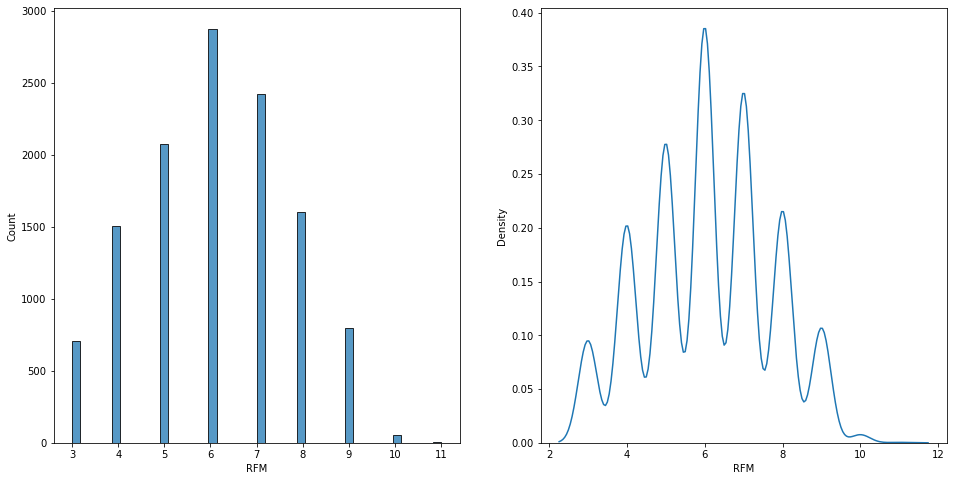

In [65]:
plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
sns.histplot(df_trim.RFM)
plt.subplot(1,2,2)
sns.kdeplot(df_trim.RFM)
#plt.plot([7.5,7.5], [0, 0.07], color='red', alpha = 0.5)
#plt.plot([17.5,17.5], [0, 0.07], color='red', alpha = 0.5)
#plt.plot([35,35], [0, 0.07], color='red', alpha = 0.5)
plt.show()

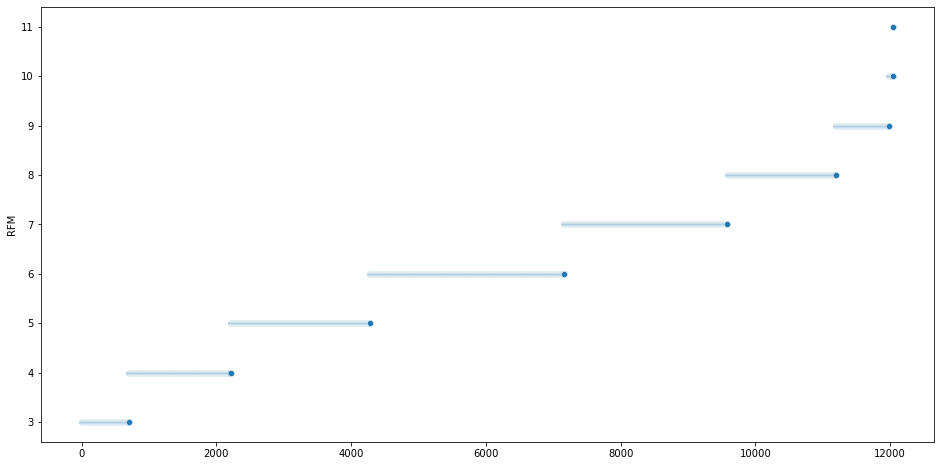

In [66]:
plt.figure(figsize=(16,8))
sns.scatterplot(x=np.arange(len(df_trim.RFM)), y=df_trim.RFM.sort_values())
plt.show()

In [67]:
for i in range(12,2,-1):
    print(f"{i:02d} RFM_R = {df_trim.loc[(df_trim.RFM==i),'RFM_R'].mean():.2f} RFM_F = {df_trim.loc[(df_trim.RFM==i),'RFM_F'].mean():.2f} RFM_M = {df_trim.loc[(df_trim.RFM==i),'RFM_M'].mean():.2f}")

12 RFM_R = nan RFM_F = nan RFM_M = nan
11 RFM_R = 4.00 RFM_F = 3.00 RFM_M = 4.00
10 RFM_R = 3.89 RFM_F = 2.21 RFM_M = 3.89
09 RFM_R = 3.93 RFM_F = 1.14 RFM_M = 3.93
08 RFM_R = 3.51 RFM_F = 1.08 RFM_M = 3.41
07 RFM_R = 3.00 RFM_F = 1.06 RFM_M = 2.94
06 RFM_R = 2.45 RFM_F = 1.05 RFM_M = 2.50
05 RFM_R = 1.95 RFM_F = 1.04 RFM_M = 2.01
04 RFM_R = 1.49 RFM_F = 1.02 RFM_M = 1.49
03 RFM_R = 1.00 RFM_F = 1.00 RFM_M = 1.00


In [68]:
df_trim.loc[(df_trim.RFM==10), 'str_RFM'].value_counts()

424    44
334     6
433     6
Name: str_RFM, dtype: int64

In [69]:
#client VIP
filter_VIP = df_trim[df_trim.str_RFM.isin(['444','434','424','414'])].index
df_trim.loc[filter_VIP,'class_RFM'] = 'VIP'

In [70]:
#client VIP presque perdus
filter_VIP_presquePerdus = df_trim[df_trim.str_RFM.isin(['244','234','224','214'])].index
df_trim.loc[filter_VIP_presquePerdus,'class_RFM'] = 'VIP presque perdus'

In [71]:
#client VIP perdus
filter_VIP_presquePerdus = df_trim[df_trim.str_RFM.isin(['144','134','124','114'])].index
df_trim.loc[filter_VIP_presquePerdus,'class_RFM'] = 'VIP perdus'

In [72]:
#client non interesse perdus
filter_Perdus = df_trim[df_trim.str_RFM.isin(['111', '112'])].index
df_trim.loc[filter_Perdus,'class_RFM'] = 'Non interesses perdus'

In [73]:
#nouveux clients
filter_newClients = df_trim[df_trim.str_RFM.isin(['411', '412'])].index
df_trim.loc[filter_newClients,'class_RFM'] = 'Nouveaux'

In [74]:
#Clients fideles
filter_fidel = (df_trim.RFM_F!=1) & (df_trim.class_RFM.isna())
filter_newClients = df_trim[filter_fidel].index
df_trim.loc[filter_newClients,'class_RFM'] = 'Fideles'

In [75]:
#Clients depensiers
filter_depens = (df_trim.RFM_M.isin([4,3])) & (df_trim.class_RFM.isna())
filter_Clients_depens = df_trim[filter_depens].index
df_trim.loc[filter_Clients_depens,'class_RFM'] = 'Depensiers'

In [76]:
#Clients recents a relancer
filter_depens = (df_trim.str_RFM.isin(['311', '312'])) & (df_trim.class_RFM.isna())
filter_Clients_depens = df_trim[filter_depens].index
df_trim.loc[filter_Clients_depens,'class_RFM'] = 'Recents à relancer'

In [77]:
#Clients presque perdus
filter_depens = (df_trim.str_RFM.isin(['211', '212'])) & (df_trim.class_RFM.isna())
filter_Clients_depens = df_trim[filter_depens].index
df_trim.loc[filter_Clients_depens,'class_RFM'] = 'Presque perdus'

In [78]:
#Clients autres
df_trim.class_RFM.fillna(value='Autres', inplace=True)

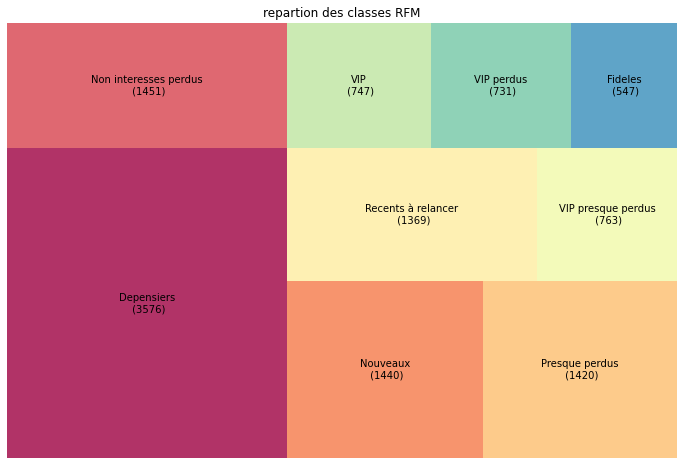

In [80]:
import squarify
note_pie = df_trim.class_RFM.value_counts()
labels = note_pie.index
labels = []
for i in range(0,len(note_pie)):
    labels.append(f"{note_pie.index[i]}\n ({note_pie[i]})")
    
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

plt.figure(figsize=(12, 8))
squarify.plot(sizes=note_pie, label=labels, alpha=.8, color=colors)
plt.axis('off')
plt.title('repartion des classes RFM')
plt.savefig('P2_02_Treemap_RFM.jpg')
plt.show()



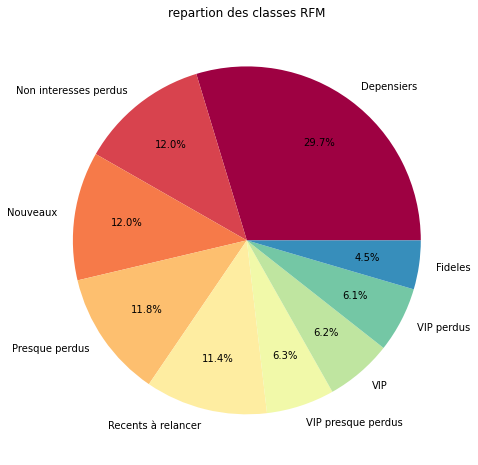

In [81]:
note_pie = df_trim.class_RFM.value_counts()

plt.figure(figsize=(12, 8))
plt.pie(note_pie, labels= note_pie.index, autopct='%1.1f%%', pctdistance=0.7, colors=colors)
plt.title('repartion des classes RFM')
plt.savefig('P2_01_pie_RFM.jpg')
plt.show() 

In [86]:
df_trim.groupby(by  = 'class_RFM').mean()

,geolocation_lat,geolocation_lng,prix_par_commande,livraison_par_commande,paye_par_commande,nb_paye_par_commande,nb_commande,note_par_commande,date_commande,heure_commande,delai_jours,RFM_R,RFM_F,RFM_M,RFM
class_RFM,,,,,,,,,,,,,,,
Depensiers,-21.246404,-46.139834,117.637671,21.389150,139.089348,3.499161,1.000000,4.242450,64.498322,56045.167785,11.410466,2.640660,1.000000,3.203300,6.843960
Fideles,-21.291656,-46.396233,71.861298,18.481664,92.006088,3.259598,2.180987,4.124314,68.444241,55219.297989,11.525498,2.621572,2.159049,2.184644,6.965265
Non interesses perdus,-21.354926,-46.442872,40.609649,16.403832,57.067023,1.946244,1.000000,4.246726,133.782908,55268.241902,11.038487,1.000000,1.000000,1.512750,3.512750
Nouveaux,-21.629555,-46.491908,41.955299,16.295007,58.267792,2.213889,1.000000,4.243056,16.759722,54512.479167,10.851810,4.000000,1.000000,1.559028,6.559028
Presque perdus,-21.290283,-46.521426,40.575268,16.188007,56.797239,2.138028,1.000000,4.219718,85.730282,55584.204930,11.679872,2.000000,1.000000,1.485211,4.485211
Recents à relancer,-21.057430,-46.266652,41.583798,16.435135,58.062001,2.246896,1.000000,4.248356,47.499635,54701.062820,10.675067,3.000000,1.000000,1.542001,5.542001
VIP,-21.079000,-46.304697,187.304444,23.875341,211.324913,4.475234,1.066934,4.255689,16.544846,55399.552878,11.574210,4.000000,1.066934,4.000000,9.066934
VIP perdus,-20.961043,-46.005918,187.116772,26.008112,213.161710,3.763338,1.030096,4.240766,134.800274,55843.926129,12.078524,1.000000,1.030096,4.000000,6.030096
VIP presque perdus,-21.093896,-46.097450,196.067313,24.849528,220.949751,4.128440,1.020970,4.201835,86.073394,55883.605505,12.277457,2.000000,1.020970,4.000000,7.020970


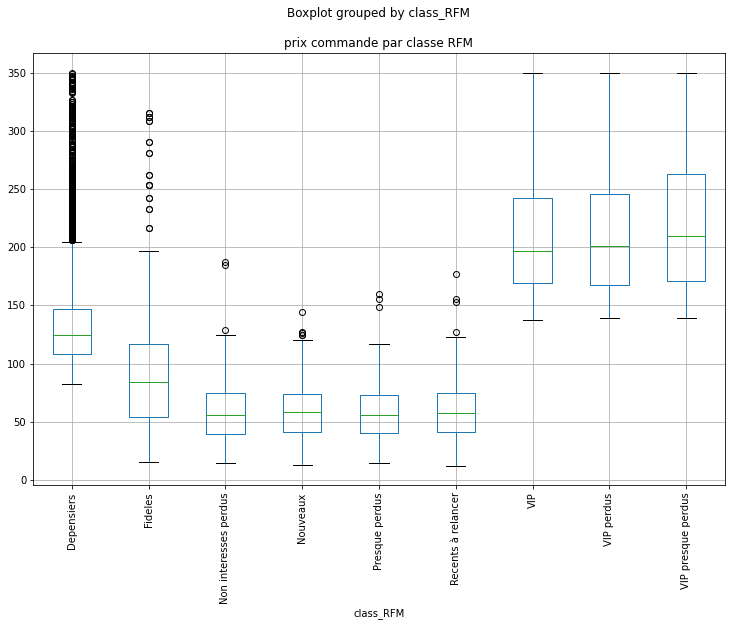

In [87]:
df_trim.boxplot('paye_par_commande', by='class_RFM',  figsize=(12, 8))
plt.xticks(rotation=90)
plt.title('prix commande par classe RFM')
plt.savefig('P2_03_price_RFM.jpg')
plt.show()

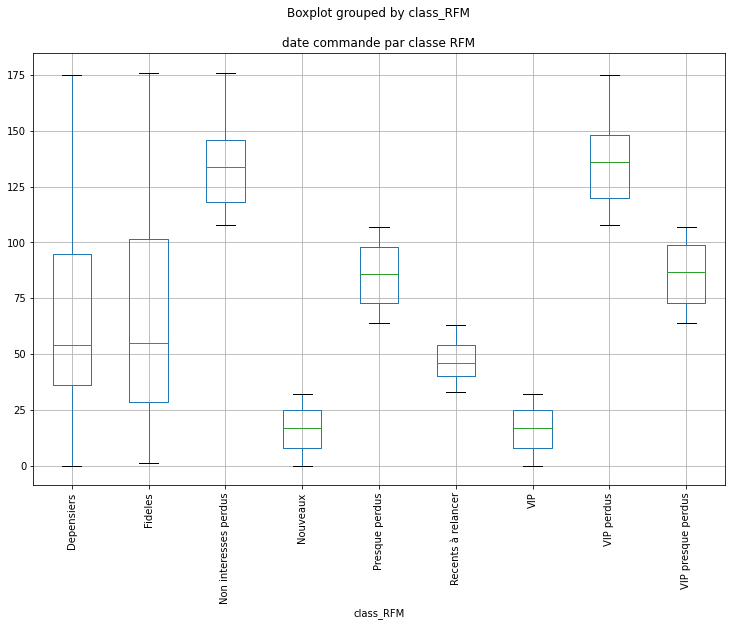

In [88]:
df_trim.boxplot('date_commande', by='class_RFM',  figsize=(12, 8))
plt.xticks(rotation=90)
plt.title('date commande par classe RFM')
plt.savefig('P2_04_date_RFM.jpg')
plt.show()

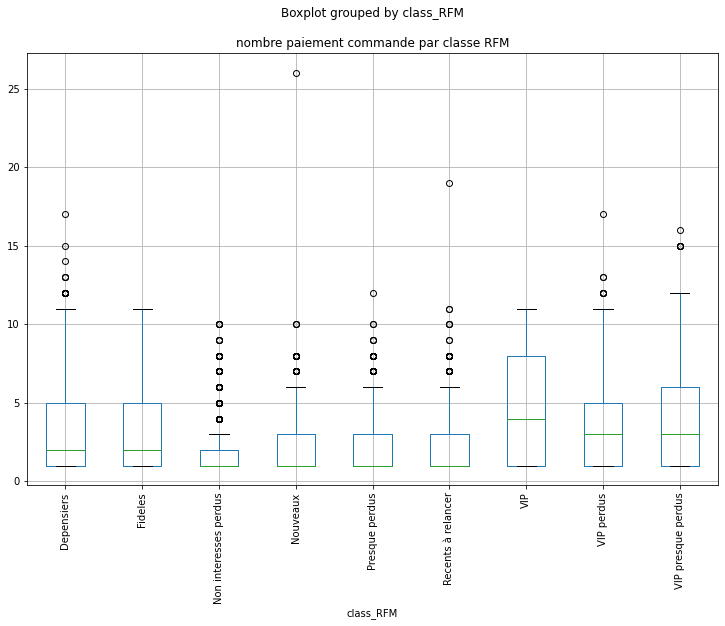

In [89]:
df_trim.boxplot('nb_paye_par_commande', by='class_RFM',  figsize=(12, 8))
plt.xticks(rotation=90)
plt.title('nombre paiement commande par classe RFM')
plt.savefig('P2_05_nb_paiement_RFM.jpg')
plt.show()

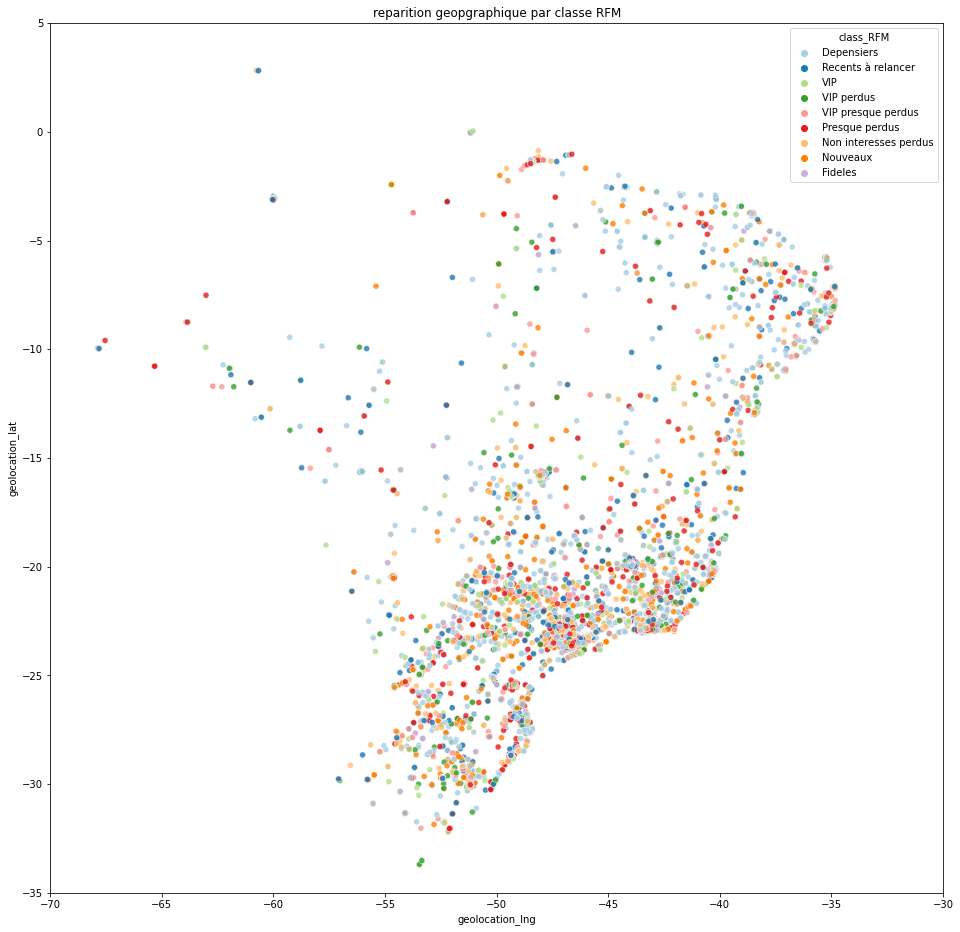

In [90]:
plt.figure(figsize=(16,16))
sns.scatterplot(x='geolocation_lng', y='geolocation_lat', data=df_trim, hue='class_RFM' , palette='Paired', alpha=0.8)
plt.xlim(-70,-30)
plt.ylim(-35,5)
plt.title('reparition geopgraphique par classe RFM')
plt.savefig('P2_06_geoloc_RFM.jpg')
plt.show()

In [91]:
df_trim

,geolocation_lat,geolocation_lng,prix_par_commande,livraison_par_commande,paye_par_commande,nb_paye_par_commande,nb_commande,date_derniere_commande,note_par_commande,delai,main_categ_count_en,main_categ_price_en,date_commande,heure_commande,delai_jours,RFM_R,RFM_F,RFM_M,RFM,str_RFM,class_RFM
0,-20.498489,-47.396929,124.990,21.880,146.87,2,1,2017-05-16 15:05:35,4,8 days 19:30:00,office_furniture,office_furniture,45.0,54335,8.812500,3,1,3,7,313,Depensiers
21,-23.560949,-46.688422,89.900,12.130,102.03,2,1,2017-05-11 13:48:47,3,26 days 22:13:27,bed_bath_table,bed_bath_table,50.0,49727,26.926007,3,1,3,7,313,Depensiers
26,-25.417946,-49.206790,79.900,14.730,94.63,1,1,2017-04-14 11:24:56,5,6 days 05:39:55,baby,baby,77.0,41096,6.236053,2,1,3,6,213,Depensiers
30,-23.604780,-46.693559,29.990,17.600,47.59,1,1,2017-05-15 17:58:25,3,3 days 17:11:46,kitchen_dining_laundry_garden_furniture,kitchen_dining_laundry_garden_furniture,46.0,64705,3.716505,3,1,1,5,311,Recents à relancer
37,-22.479458,-44.497006,168.925,49.965,218.89,8,2,2017-06-14 18:52:29,5,16 days 08:11:00.500000,bed_bath_table,bed_bath_table,16.0,67949,16.340978,4,2,4,10,424,VIP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99420,-21.341162,-43.377558,49.900,14.520,64.42,1,1,2017-01-25 16:51:27,1,13 days 15:47:22,fashion_bags_accessories,fashion_bags_accessories,156.0,60687,13.657894,1,1,2,4,112,Non interesses perdus
99424,-23.530801,-46.335356,89.900,12.130,102.03,1,1,2017-05-15 17:42:38,1,6 days 20:32:07,home_confort,home_confort,46.0,63758,6.855637,3,1,3,7,313,Depensiers
99428,-22.769600,-47.150402,110.000,20.850,130.85,1,1,2017-03-27 16:26:18,4,7 days 21:31:35,furniture_decor,furniture_decor,95.0,59178,7.896933,2,1,3,6,213,Depensiers
99430,-23.673541,-47.023418,89.900,12.130,102.03,1,1,2017-05-24 11:54:31,5,9 days 02:18:07,bed_bath_table,bed_bath_table,37.0,42871,9.095914,3,1,3,7,313,Depensiers


In [92]:
df_trim[['paye_par_commande', 'nb_commande', 'date_commande', 'RFM_R', 'RFM_F', 'RFM_M', 'str_RFM', 'class_RFM']]

,paye_par_commande,nb_commande,date_commande,RFM_R,RFM_F,RFM_M,str_RFM,class_RFM
0,146.87,1,45.0,3,1,3,313,Depensiers
21,102.03,1,50.0,3,1,3,313,Depensiers
26,94.63,1,77.0,2,1,3,213,Depensiers
30,47.59,1,46.0,3,1,1,311,Recents à relancer
37,218.89,2,16.0,4,2,4,424,VIP
...,...,...,...,...,...,...,...,...
99420,64.42,1,156.0,1,1,2,112,Non interesses perdus
99424,102.03,1,46.0,3,1,3,313,Depensiers
99428,130.85,1,95.0,2,1,3,213,Depensiers
99430,102.03,1,37.0,3,1,3,313,Depensiers


In [93]:
df_trim['class_RFM'] = df_trim['class_RFM'].astype('category')
df_trim['Total']=1
df_trim.groupby('class_RFM').agg(
    {
        'Total': 'count',
        'main_categ_count_en': lambda x: x.value_counts().index[0],
        'main_categ_price_en': lambda x: x.value_counts().index[0],
        'prix_par_commande': 'mean',
        'nb_paye_par_commande': 'mean',
        'nb_commande': 'mean',
        'date_commande': 'mean',
        'delai_jours': 'mean',
        'note_par_commande' : 'mean'
    }
).reset_index()

,class_RFM,Total,main_categ_count_en,main_categ_price_en,prix_par_commande,nb_paye_par_commande,nb_commande,date_commande,delai_jours,note_par_commande
0,Depensiers,3576,bed_bath_table,bed_bath_table,117.637671,3.499161,1.000000,64.498322,11.410466,4.242450
1,Fideles,547,bed_bath_table,bed_bath_table,71.861298,3.259598,2.180987,68.444241,11.525498,4.124314
2,Non interesses perdus,1451,furniture_decor,furniture_decor,40.609649,1.946244,1.000000,133.782908,11.038487,4.246726
3,Nouveaux,1440,housewares,housewares,41.955299,2.213889,1.000000,16.759722,10.851810,4.243056
4,Presque perdus,1420,telephony,telephony,40.575268,2.138028,1.000000,85.730282,11.679872,4.219718
5,Recents à relancer,1369,telephony,telephony,41.583798,2.246896,1.000000,47.499635,10.675067,4.248356
6,VIP,747,bed_bath_table,bed_bath_table,187.304444,4.475234,1.066934,16.544846,11.574210,4.255689
7,VIP perdus,731,furniture_decor,furniture_decor,187.116772,3.763338,1.030096,134.800274,12.078524,4.240766
8,VIP presque perdus,763,perfumery,perfumery,196.067313,4.128440,1.020970,86.073394,12.277457,4.201835


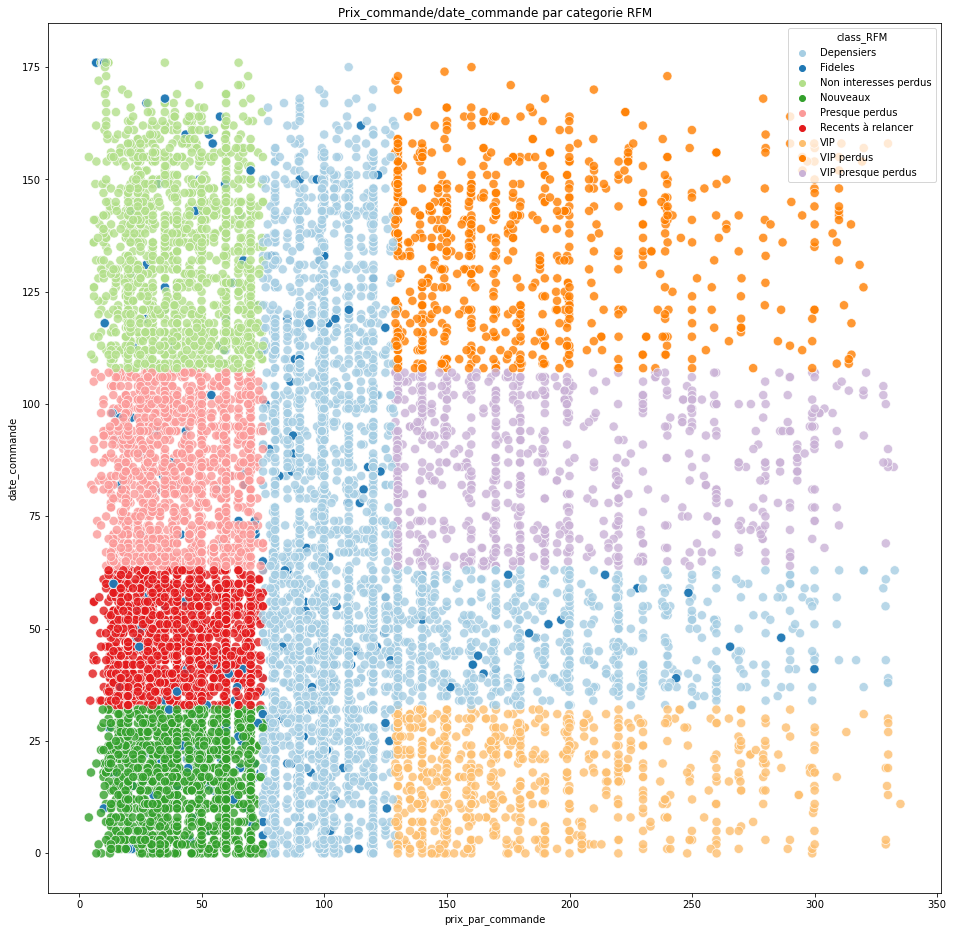

In [94]:
df_trim['class_RFM'] = df_trim['class_RFM'].astype('category')
plt.figure(figsize=(16,16))
sns.scatterplot(data=df_trim, x='prix_par_commande', y='date_commande',
                hue='class_RFM', s=85, alpha=0.8, palette='Paired')
plt.title('Prix_commande/date_commande par categorie RFM')
plt.savefig('P2_18_prix_date_RFM.jpg')
plt.show()

# premier cluster

In [103]:
data_cluster = df_trim[['paye_par_commande', 'delai_jours', 'date_commande', 'nb_paye_par_commande']].copy()

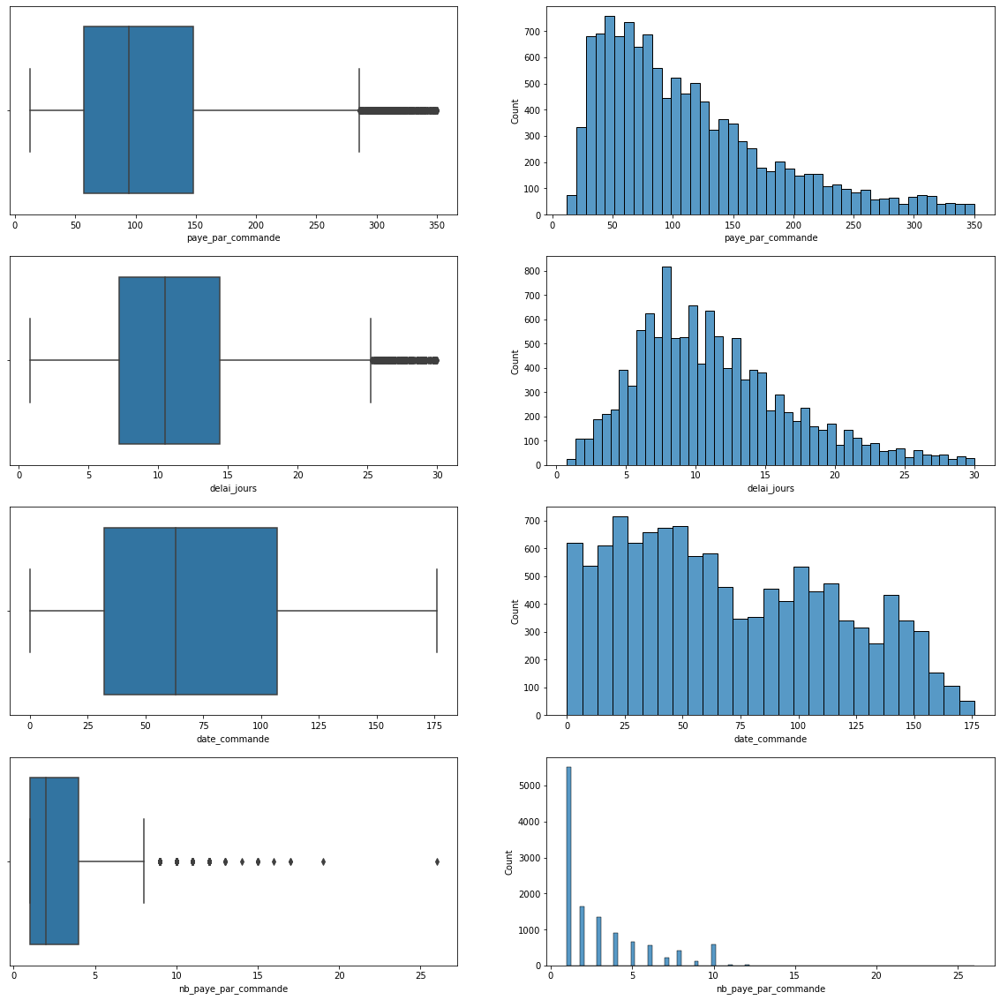

In [105]:
plt.figure(figsize=(20,20))
nb_colonne = len(data_cluster.columns)
for i in range(0,nb_colonne):
    plt.subplot(nb_colonne,2,2*i+1)
    sns.boxplot(x = data_cluster.iloc[:,i], orient='Vertical')
    plt.subplot(nb_colonne,2,2*(i+1))
    sns.histplot(x = data_cluster.iloc[:,i])
plt.savefig('P2_20_FE_0.jpg')
plt.show()

In [107]:
data_cluster.paye_par_commande = np.log1p(data_cluster.paye_par_commande)
data_cluster.delai_jours = np.log1p(data_cluster.delai_jours)

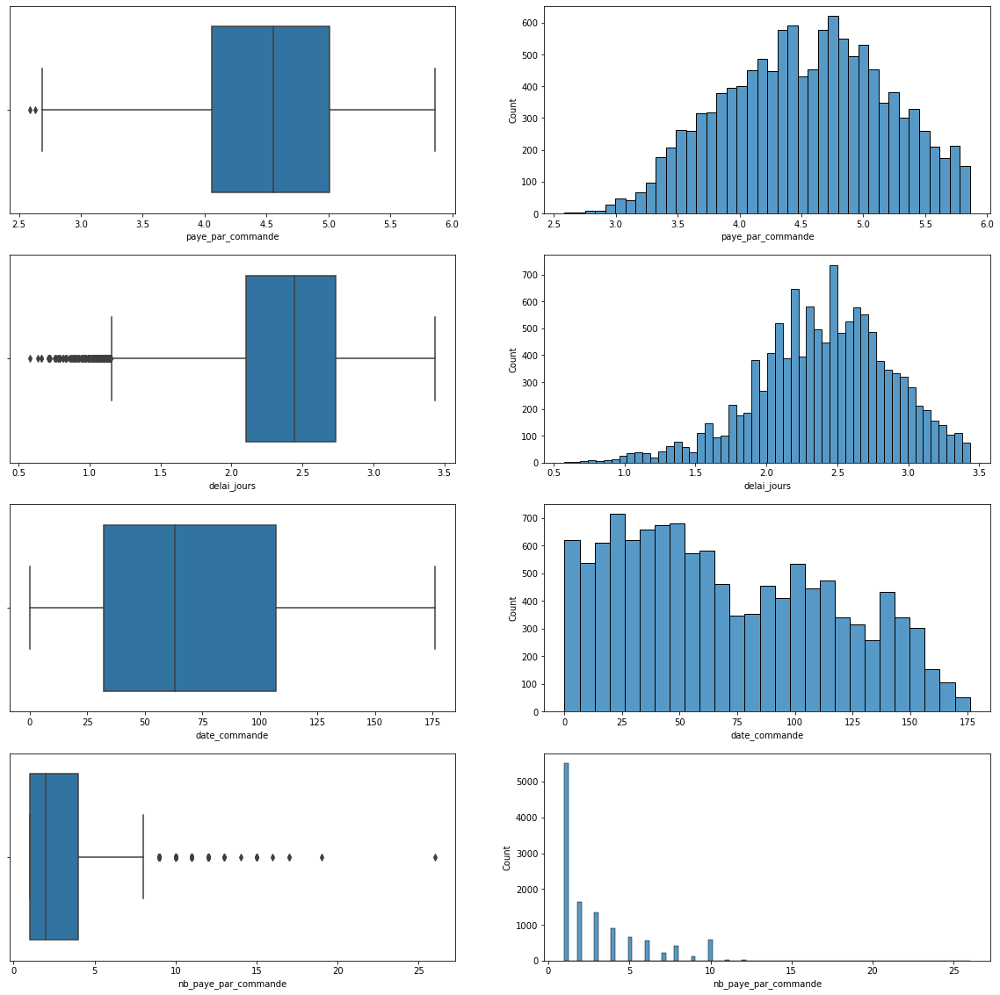

In [108]:
plt.figure(figsize=(20,20))
nb_colonne = len(data_cluster.columns)
for i in range(0,nb_colonne):
    plt.subplot(nb_colonne,2,2*i+1)
    sns.boxplot(x = data_cluster.iloc[:,i], orient='Vertical')
    plt.subplot(nb_colonne,2,2*(i+1))
    sns.histplot(x = data_cluster.iloc[:,i])
plt.savefig('P2_20_FE_1_log.jpg')
plt.show()

In [109]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import QuantileTransformer 
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import PowerTransformer

data_cluster['paye_par_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['paye_par_commande']).reshape(-1, 1))
data_cluster['date_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['date_commande']).reshape(-1, 1))
data_cluster['delai_jours'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['delai_jours']).reshape(-1, 1))
X_std = MinMaxScaler().fit_transform(data_cluster)

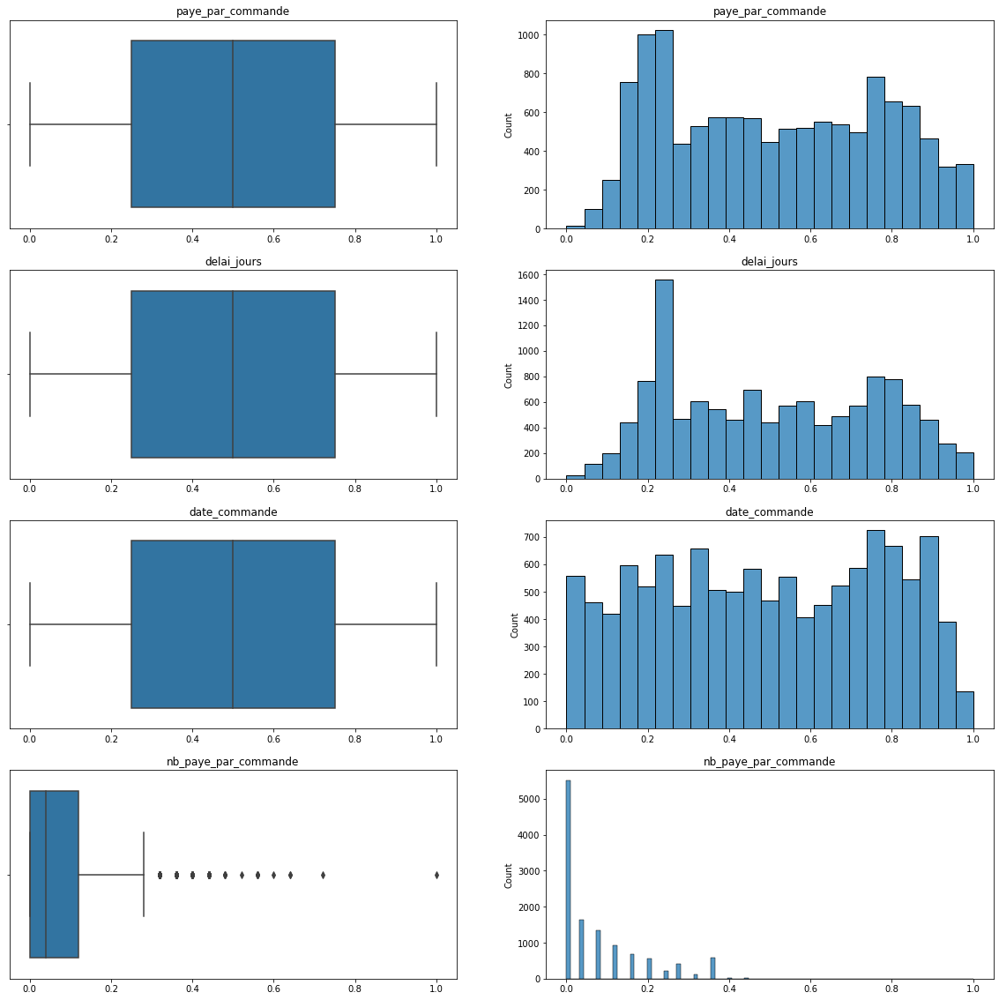

In [110]:
plt.figure(figsize=(20,20))
nb_colonne = len(data_cluster.columns)
for i in range(0,nb_colonne):
    plt.subplot(nb_colonne,2,2*i+1)
    plt.title(data_cluster.columns[i])
    sns.boxplot(x = X_std[:,i], orient='Vertical')
    plt.subplot(nb_colonne,2,2*(i+1))
    plt.title(data_cluster.columns[i])
    sns.histplot(x = X_std[:,i])
plt.savefig('P2_20_FE_2_quantile_Min_MAx.jpg')
plt.show()

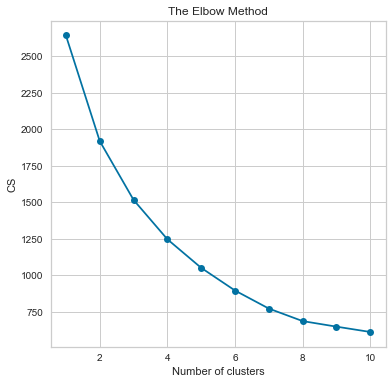

In [140]:
from sklearn.cluster import KMeans
cs = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(X_std)
    cs.append(kmeans.inertia_)

plt.figure(figsize=(6, 6))
plt.plot(range(1, 11), cs, marker = 'o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('CS')
plt.show()


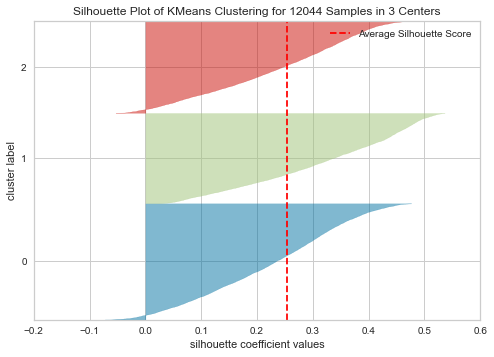

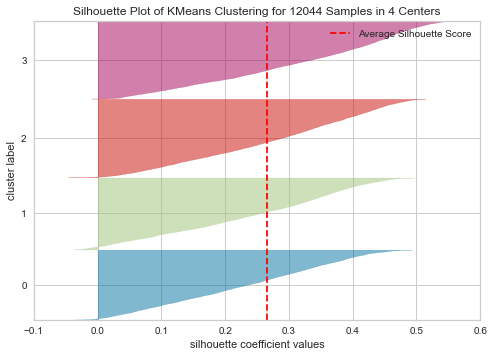

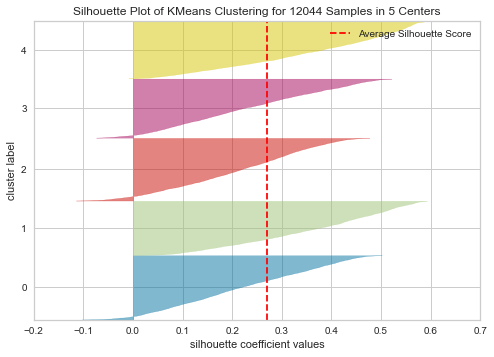

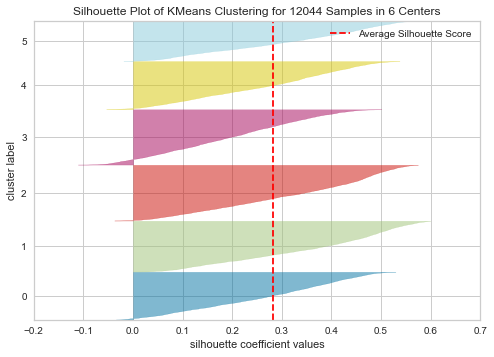

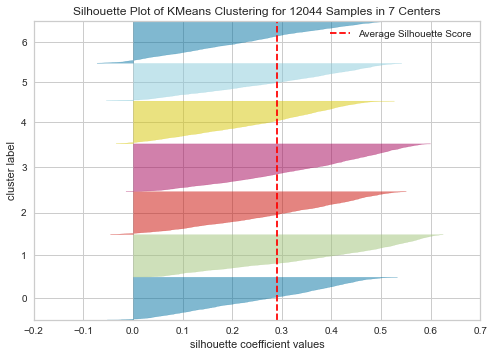

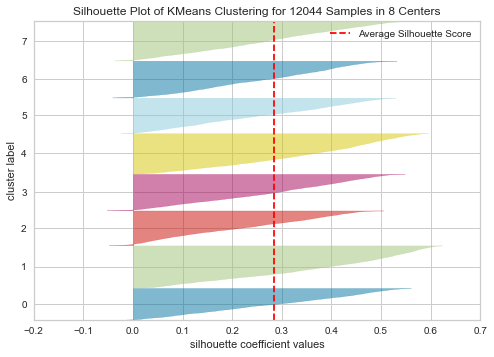

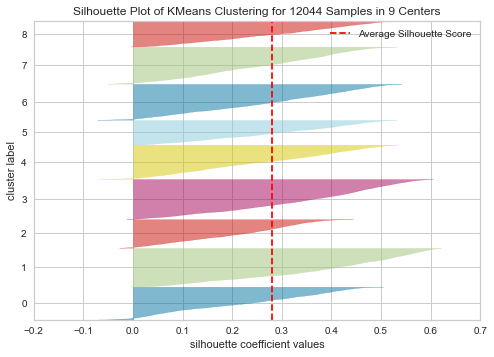

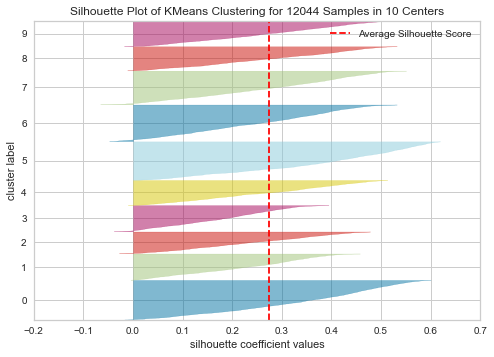

In [43]:
from yellowbrick.cluster import SilhouetteVisualizer

for i in range(3, 11):
    model = KMeans(i, random_state=1944)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    visualizer.fit(X_std)        # Fit the data to the visualizer
    savef = 'P2_07_silhouette_score_KMEANS_nbcluster-'+str(i)+'.jpg'
    plt.savefig(savef)
    visualizer.show()        # Finalize and render the figure


In [111]:
from sklearn.cluster import KMeans

km =  KMeans(n_clusters = 8, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
km.fit(X_std)

KMeans(random_state=0)

In [112]:
from sklearn.cluster import DBSCAN

dbs = DBSCAN(eps=0.05, min_samples=5)
dbs.fit(X_std)


DBSCAN(eps=0.05)

In [113]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3, random_state=1944)
X_pca = pca.fit_transform(X_std)

In [114]:
centroids = km.cluster_centers_
#plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
print(centroids)
centroids_pca = pca.transform(centroids)

[[0.76771524 0.76915124 0.71297229 0.10712006]
 [0.75428916 0.72637724 0.25270795 0.12311015]
 [0.28204995 0.27409246 0.24892621 0.0447834 ]
 [0.26576727 0.31168118 0.75943387 0.03611111]
 [0.30684753 0.75697722 0.68495191 0.04440506]
 [0.31370763 0.70468502 0.21150751 0.05307514]
 [0.73335913 0.29347046 0.24670996 0.12820786]
 [0.73570023 0.32363815 0.75168298 0.10340339]]


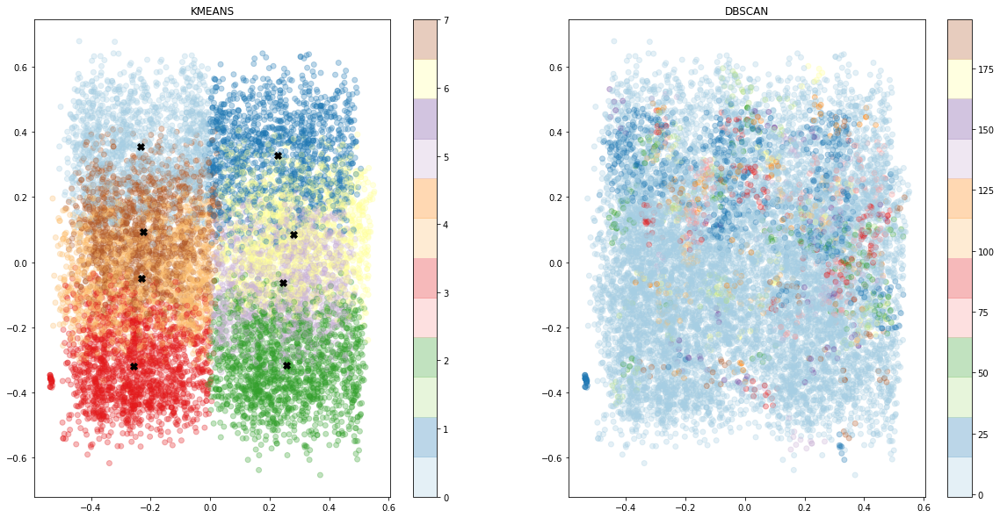

In [115]:
plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
plt.title('KMEANS')
plt.scatter(X_pca[:,0],X_pca[:,1], c = km.labels_, alpha=0.3, cmap='Paired')
plt.colorbar()
plt.scatter(centroids_pca[:,0] , centroids_pca[:,1] , s = 60, color = 'k', marker='X')
plt.subplot(1,2,2)
plt.title('DBSCAN')
plt.scatter(X_pca[:,0],X_pca[:,1], c = dbs.labels_, alpha=0.3, cmap='Paired')
plt.colorbar()
plt.show()

In [116]:
from sklearn import manifold

tsne = manifold.TSNE(n_components=2, perplexity=50, random_state=1944)
X_tsne = tsne.fit_transform(X_std)


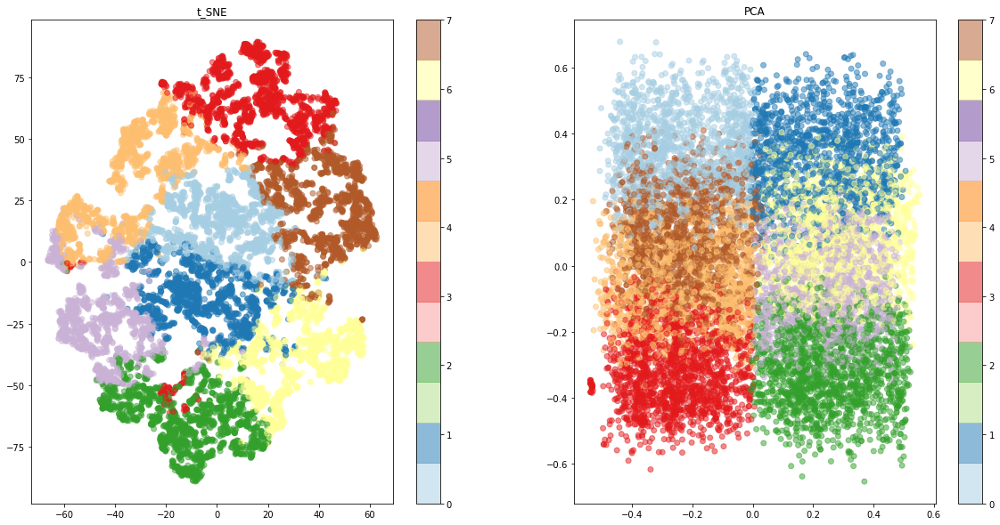

In [117]:
plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
plt.title('t_SNE')
plt.scatter(X_tsne[:,0],X_tsne[:,1], c = km.labels_, alpha=0.51, cmap='Paired')
plt.colorbar()
plt.subplot(1,2,2)
plt.title('PCA')
plt.scatter(X_pca[:,0],X_pca[:,1], c = km.labels_, alpha=0.51, cmap='Paired')
plt.colorbar()
plt.savefig('P2_075_PCA_Cluster.jpg')
plt.show()

In [157]:
from sklearn.cluster import AgglomerativeClustering

agg =  AgglomerativeClustering(n_clusters = 8)
agg.fit(X_std)

AgglomerativeClustering(n_clusters=8)

In [158]:
pd.DataFrame(agg.labels_).value_counts()

0    2289
1    2192
2    1754
3    1574
4    1339
5    1038
6    1012
7     846
dtype: int64

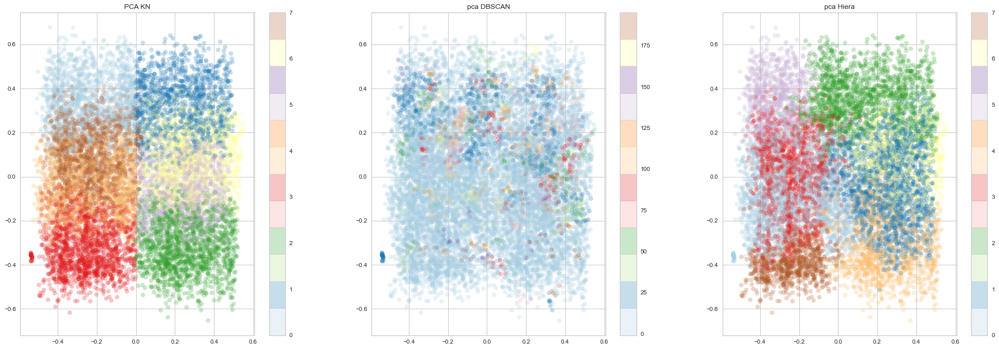

In [159]:
plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.title('PCA KN')
plt.scatter(X_pca[:,0],X_pca[:,1], c = km.labels_, alpha=0.25, cmap='Paired')
plt.colorbar()
plt.subplot(1,3,2)
plt.title('pca DBSCAN')
plt.scatter(X_pca[:,0],X_pca[:,1], c = dbs.labels_, alpha=0.25, cmap='Paired')
plt.colorbar()
plt.subplot(1,3,3)
plt.title('pca Hiera')
plt.scatter(X_pca[:,0],X_pca[:,1], c = agg.labels_, alpha=0.25, cmap='Paired')
plt.colorbar()
plt.show()

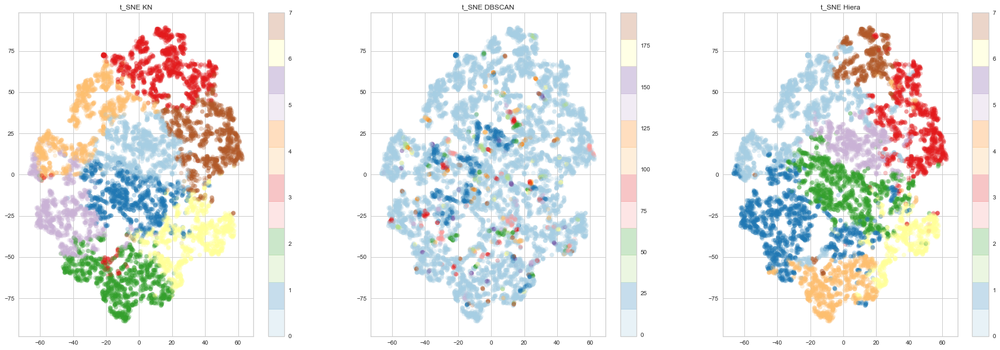

In [160]:
plt.figure(figsize=(30, 10))
plt.subplot(1,3,1)
plt.title('t_SNE KN')
plt.scatter(X_tsne[:,0],X_tsne[:,1], c = km.labels_, alpha=0.25, cmap='Paired')
plt.colorbar()
plt.subplot(1,3,2)
plt.title('t_SNE DBSCAN')
plt.scatter(X_tsne[:,0],X_tsne[:,1], c = dbs.labels_, alpha=0.25, cmap='Paired')
plt.colorbar()
plt.subplot(1,3,3)
plt.title('t_SNE Hiera')
plt.scatter(X_tsne[:,0],X_tsne[:,1], c = agg.labels_, alpha=0.25, cmap='Paired')
plt.colorbar()
plt.savefig('P2_075_PCA_Cluster_Hiera.jpg')
plt.show()

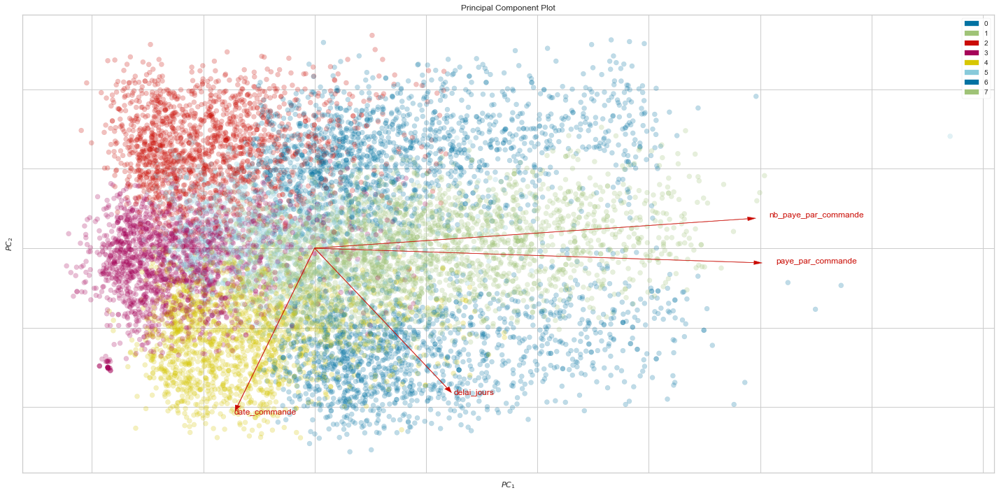

<AxesSubplot:title={'center':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [161]:
from yellowbrick.datasets import load_credit
from yellowbrick.features import PCA
plt.figure(figsize=(20, 10))

visualizer = PCA(projection = 2,proj_features=True,features = data_cluster.columns, random_state=1944, alpha=0.25)
visualizer.fit_transform(X_std, km.labels_)
plt.savefig('P2_075_PCA_Cluster_yellow.jpg')
visualizer.show()

C:\Users\paps\anaconda3\envs\openclass\lib\site-packages\yellowbrick\features\pca.py:448: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout()


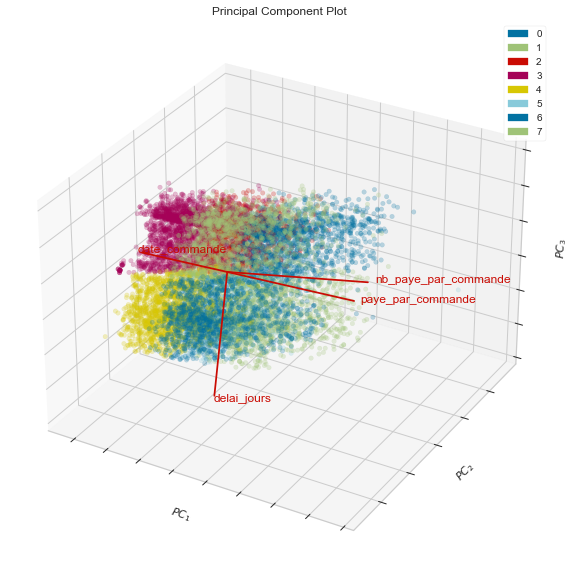

<Axes3DSubplot:title={'center':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [162]:
from yellowbrick.datasets import load_credit
from yellowbrick.features import PCA
plt.figure(figsize=(20, 10))

visualizer = PCA(projection = 3,proj_features=True,features = data_cluster.columns, random_state=1944, alpha=0.25)
visualizer.fit_transform(X_std, km.labels_)
#visualizer.fit_transform(X_std, dbs.labels_)
visualizer.show()

In [118]:
data_X_tsd = pd.DataFrame(X_std,columns=data_cluster.columns.tolist())
data_X_tsd.describe()

,paye_par_commande,delai_jours,date_commande,nb_paye_par_commande
count,12044.000000,12044.000000,12044.000000,12044.000000
mean,0.510732,0.508863,0.492612,0.078446
std,0.259581,0.250708,0.279186,0.106027
min,0.000000,0.000000,0.000000,0.000000
25%,0.250000,0.250000,0.250000,0.000000
50%,0.500004,0.500006,0.500000,0.040000
75%,0.750000,0.749939,0.750000,0.120000
max,1.000000,1.000000,1.000000,1.000000


In [119]:
km.cluster_centers_

array([[0.76771524, 0.76915124, 0.71297229, 0.10712006],
       [0.75428916, 0.72637724, 0.25270795, 0.12311015],
       [0.28204995, 0.27409246, 0.24892621, 0.0447834 ],
       [0.26576727, 0.31168118, 0.75943387, 0.03611111],
       [0.30684753, 0.75697722, 0.68495191, 0.04440506],
       [0.31370763, 0.70468502, 0.21150751, 0.05307514],
       [0.73335913, 0.29347046, 0.24670996, 0.12820786],
       [0.73570023, 0.32363815, 0.75168298, 0.10340339]])

In [166]:
kiviat = pd.DataFrame(columns=data_X_tsd.columns)

for i in range(0,8):
    #affic = data_cluster[km.labels_==0]
    affic = data_X_tsd[(km.labels_==i)]
    for column in kiviat:
        kiviat.loc[i,column]=affic[column].mean()
    print('cluster',i,'contenant',affic.shape[0])
    print(affic.mean())

cluster 0 contenant 1440
paye_par_commande       0.767562
delai_jours             0.769141
date_commande           0.713137
nb_paye_par_commande    0.107056
dtype: float64
cluster 1 contenant 1389
paye_par_commande       0.754603
delai_jours             0.726425
date_commande           0.252921
nb_paye_par_commande    0.123254
dtype: float64
cluster 2 contenant 1642
paye_par_commande       0.282106
delai_jours             0.274614
date_commande           0.248692
nb_paye_par_commande    0.044580
dtype: float64
cluster 3 contenant 1729
paye_par_commande       0.265840
delai_jours             0.311577
date_commande           0.759297
nb_paye_par_commande    0.036206
dtype: float64
cluster 4 contenant 1579
paye_par_commande       0.306650
delai_jours             0.756671
date_commande           0.685135
nb_paye_par_commande    0.044408
dtype: float64
cluster 5 contenant 1290
paye_par_commande       0.314232
delai_jours             0.705601
date_commande           0.211534
nb_paye_par_comm

In [171]:
data_X_tsd[(km.labels_== 1)].shape[0]

1389

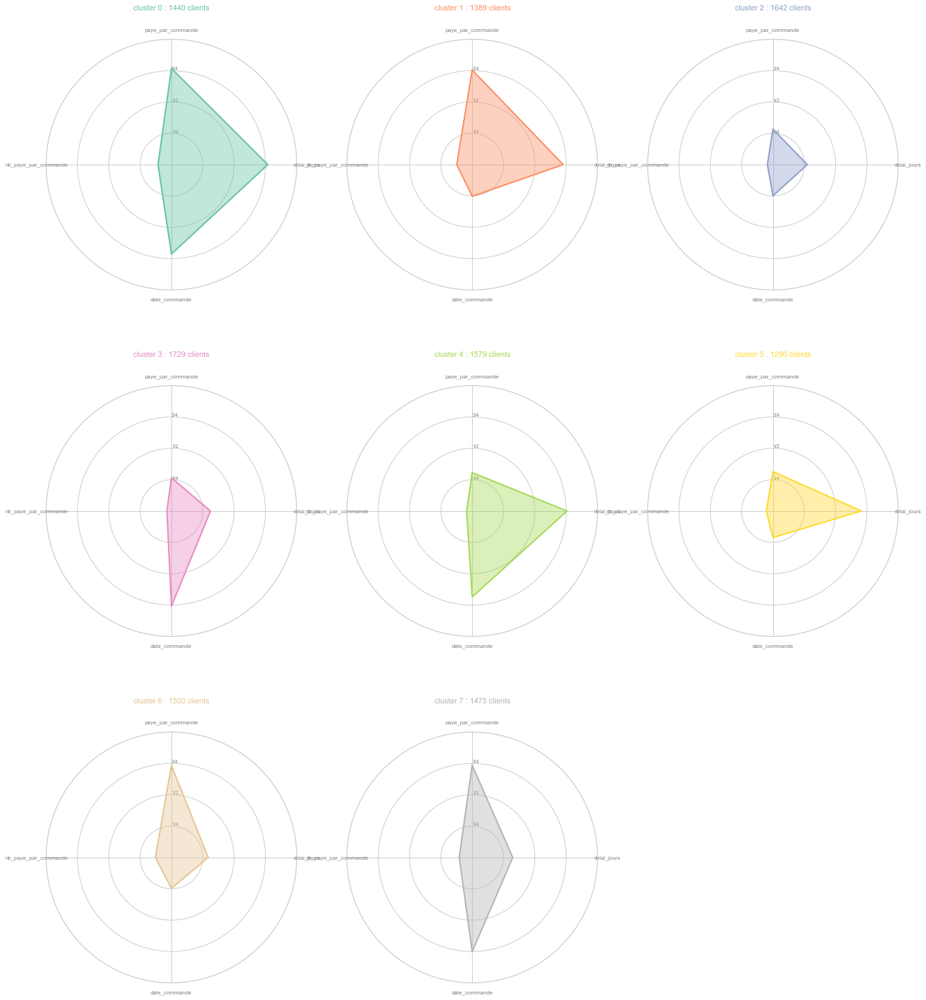

In [172]:
# ------- PART 1: Define a function that do a plot for one line of the dataset!
 
def make_spider( row, title, color):

    # number of variable
    categories=list(kiviat)
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(3,3,row+1, polar=True, )

    # If you want the first axis to be on top:
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([0.25,0.5,0.75], ["1/4","1/2","3/4"], color="grey", size=7)
    plt.ylim(0,1)

    # Ind1
    values=kiviat.loc[row].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    title += ' : '+str(data_X_tsd[(km.labels_== row)].shape[0]) + ' clients'
    plt.title(title, size=11, color=color, y=1.1)
    
# ------- PART 2: Apply the function to all individuals
# initialize the figure
plt.figure(figsize=(22, 26))
 
# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(kiviat.index))
 
# Loop to plot
for row in range(0, len(kiviat.index)):
    make_spider( row=row, title='cluster '+str(row), color=my_palette(row))
    
plt.savefig('P2_17_kiviat.jpg')


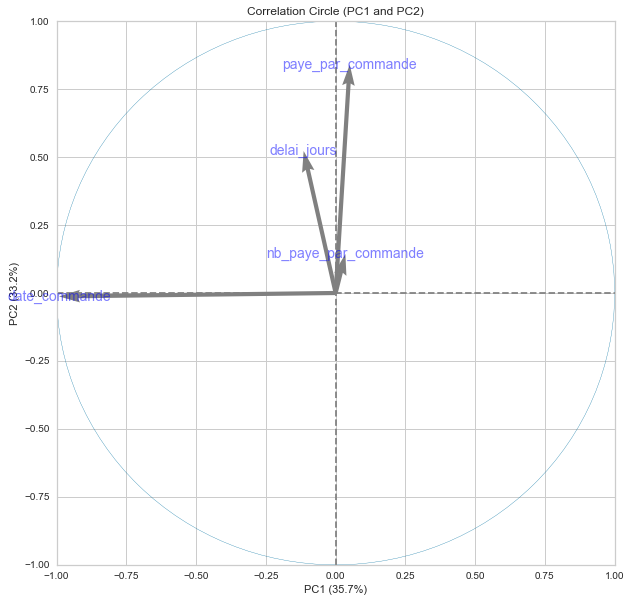

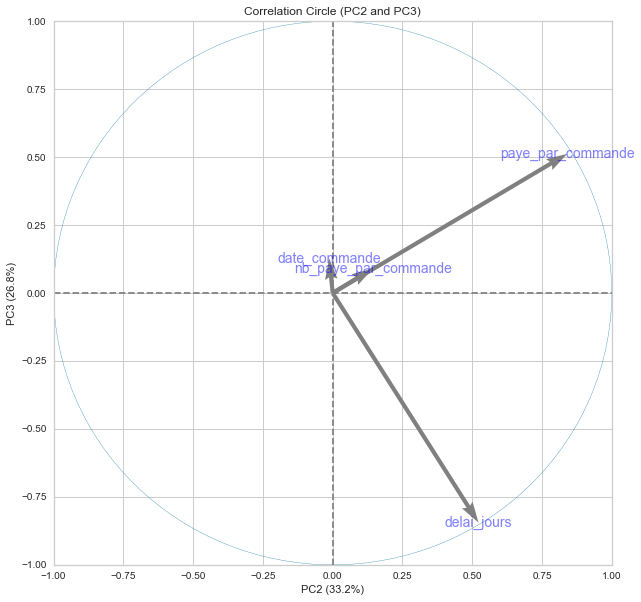

In [173]:
# Generate a correlation circle
pcs = pca.components_ 
display_circles(pcs, 3, pca, [(0, 1)], labels = np.array(data_cluster.columns.tolist()),)
display_circles(pcs, 3, pca, [(1, 2)], labels = np.array(data_cluster.columns.tolist()),)

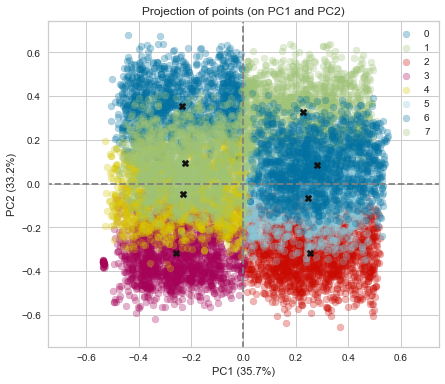

In [174]:
display_factorial_planes(X_pca, 3, pca, [(0,1)], illustrative_var = km.labels_, alpha = 0.3)
plt.scatter(centroids_pca[:,0],centroids_pca[:,1],marker='X', c='k')

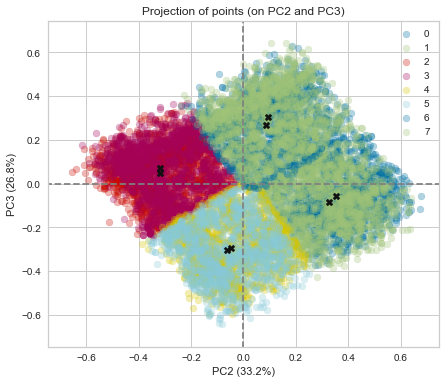

In [175]:
display_factorial_planes(X_pca, 3, pca, [(1,2)], illustrative_var = km.labels_, alpha = 0.3)
plt.scatter(centroids_pca[:,1],centroids_pca[:,2],marker='X', c='k')

In [120]:
data_cluster['cluster_label'] = km.labels_
df_trim['cluster_label'] = data_cluster['cluster_label'] 
data_cluster['cluster_label'].value_counts()

3    1729
2    1642
4    1579
6    1500
7    1475
0    1440
1    1389
5    1290
Name: cluster_label, dtype: int64

In [121]:
df_trim['cluster_label'] = df_trim['cluster_label'].astype('category')
df_trim['Total']=1
df__trim_cluster = df_trim.groupby('cluster_label').agg(
    {
        'Total': 'count',
        'main_categ_count_en': lambda x: x.value_counts().index[0],
        'main_categ_price_en': lambda x: x.value_counts().index[0],
        'class_RFM': lambda x: x.value_counts().index[0],
        'prix_par_commande': 'mean',
        'nb_paye_par_commande': 'mean',
        'nb_commande': 'mean',
        'date_commande': 'mean',
        'delai_jours': 'mean',
        'note_par_commande' : 'mean',
        'geolocation_lat' : 'mean',
        'geolocation_lng' : 'mean'        
    }
).reset_index()

In [250]:
df__trim_cluster

,cluster_label,Total,main_categ_count_en,main_categ_price_en,class_RFM,prix_par_commande,nb_paye_par_commande,nb_commande,date_commande,delai_jours,note_par_commande,geolocation_lat,geolocation_lng
0,0,1440,bed_bath_table,bed_bath_table,Depensiers,152.765764,3.676389,1.043056,104.860417,16.871560,4.077778,-19.553585,-45.985404
1,1,1389,bed_bath_table,bed_bath_table,Depensiers,145.718891,4.081353,1.093593,32.121670,15.517230,4.110871,-19.573193,-45.722427
2,2,1642,housewares,housewares,Recents à relancer,43.383356,2.114495,1.045067,31.606577,6.705551,4.354446,-22.704828,-46.589320
3,3,1729,furniture_decor,furniture_decor,Non interesses perdus,40.130902,1.905147,1.082128,114.266628,7.432379,4.357432,-22.421509,-46.464127
4,4,1579,furniture_decor,furniture_decor,Presque perdus,44.156080,2.110196,1.049398,99.398353,16.461273,4.105130,-20.218021,-46.369505
5,5,1290,bed_bath_table,bed_bath_table,Nouveaux,44.839620,2.328682,1.085271,26.921705,14.895065,4.110078,-20.254456,-46.371696
6,6,1500,bed_bath_table,bed_bath_table,Depensiers,144.062793,4.207333,1.050667,31.365333,7.074563,4.348000,-22.381537,-46.502359
7,7,1475,bed_bath_table,bed_bath_table,Depensiers,144.743132,3.585085,1.042034,112.451525,7.637923,4.352542,-22.347106,-46.203020


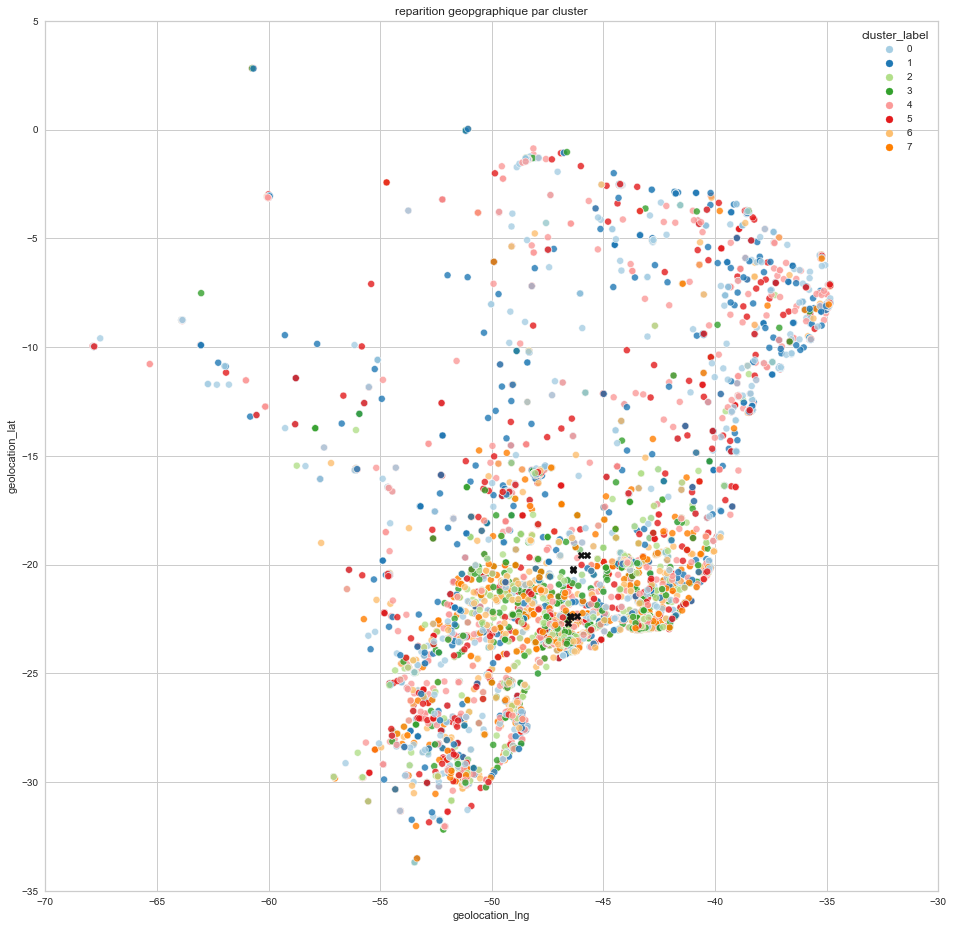

In [179]:
plt.figure(figsize=(16,16))
sns.scatterplot(x='geolocation_lng', y='geolocation_lat', data=df_trim, hue='cluster_label' , palette='Paired', alpha=0.8)
plt.scatter(df__trim_cluster['geolocation_lng'],df__trim_cluster['geolocation_lat'],marker='X', c='k')
plt.xlim(-70,-30)
plt.ylim(-35,5)
plt.title('reparition geopgraphique par cluster')
plt.savefig('P2_08_geoloc_cluster.jpg')
plt.show()

In [180]:
for i in range(0,8):
    print('CLUSTER :', i)
    print(df_trim.loc[(data_cluster.cluster_label==i),'main_categ_count_en'].value_counts().head(5))
    print(df_trim.loc[(data_cluster.cluster_label==i),'main_categ_price_en'].value_counts().head(5))
    print(df_trim.loc[(data_cluster.cluster_label==i),'class_RFM'].value_counts().head(5))
    print("#######################################################################")

CLUSTER : 0
bed_bath_table      175
furniture_decor     131
sports_leisure      110
office_furniture    109
cool_stuff           89
Name: main_categ_count_en, dtype: int64
bed_bath_table      171
furniture_decor     127
office_furniture    109
sports_leisure      108
cool_stuff           89
Name: main_categ_price_en, dtype: int64
Depensiers               629
VIP presque perdus       394
VIP perdus               367
Fideles                   26
Non interesses perdus     12
Name: class_RFM, dtype: int64
#######################################################################
CLUSTER : 1
bed_bath_table           179
cool_stuff               120
sports_leisure           110
computers_accessories     92
housewares                85
Name: main_categ_count_en, dtype: int64
bed_bath_table           179
cool_stuff               124
sports_leisure           108
computers_accessories     92
housewares                90
Name: main_categ_price_en, dtype: int64
Depensiers            884
VIP          

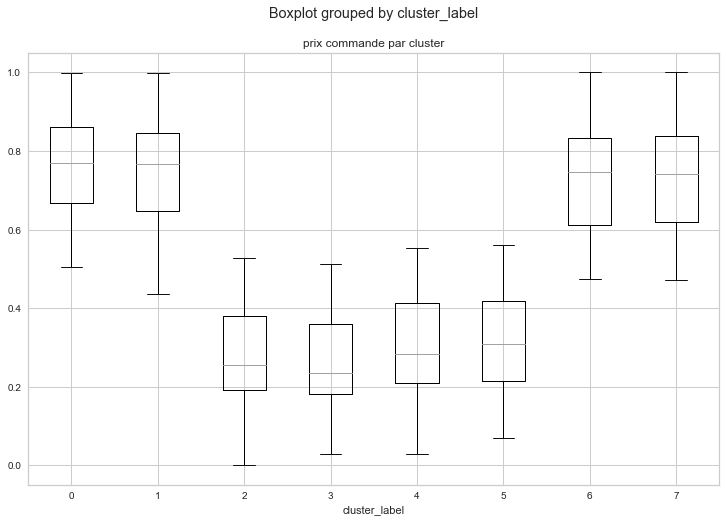

In [181]:
data_cluster.boxplot('paye_par_commande', by='cluster_label',  figsize=(12, 8))
plt.title('prix commande par cluster')
plt.savefig('P2_09_price_cluster.jpg')
plt.show()

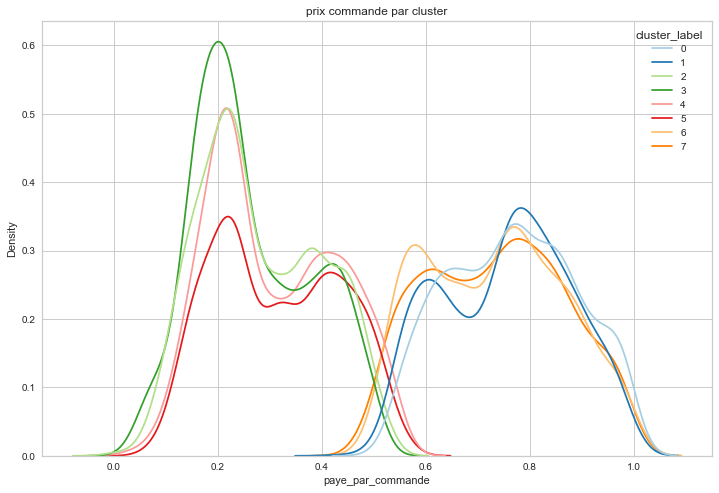

In [182]:
plt.figure(figsize=(12, 8))
sns.kdeplot(x='paye_par_commande', data = data_cluster, hue = 'cluster_label', palette = 'Paired')
plt.title('prix commande par cluster')
plt.savefig('P2_10_Dist_price_cluster.jpg')
plt.show()

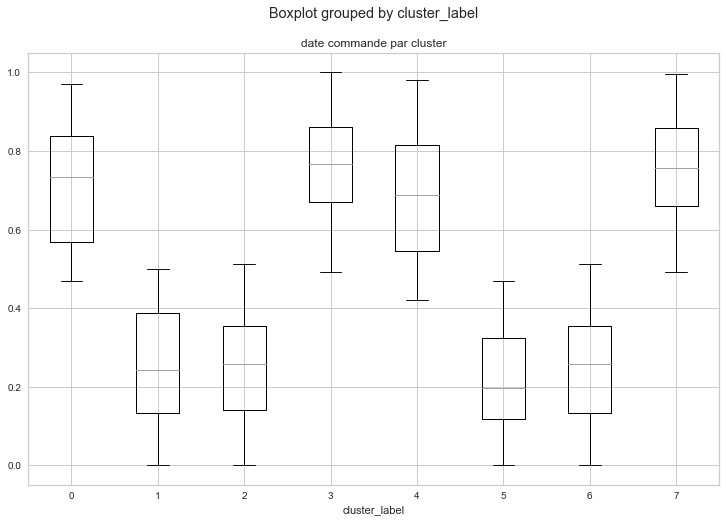

In [184]:
data_cluster.boxplot('date_commande', by='cluster_label',  figsize=(12, 8))
plt.title('date commande par cluster')
plt.savefig('P2_11_date_cluster.jpg')
plt.show()

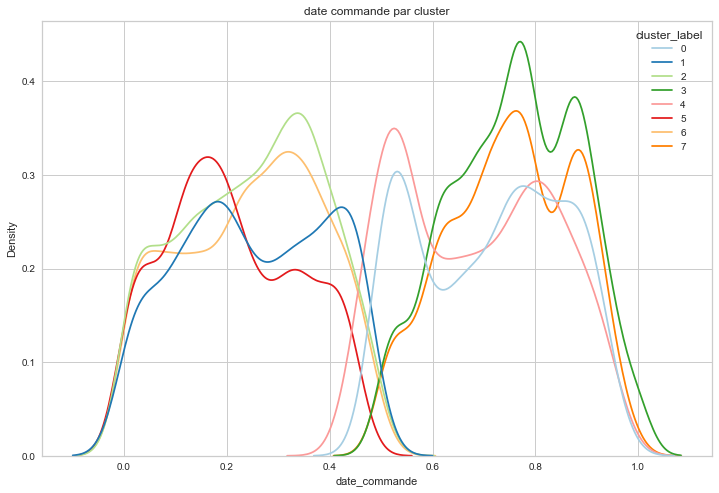

In [185]:
plt.figure(figsize=(12, 8))
sns.kdeplot(x='date_commande', data = data_cluster, hue = 'cluster_label', palette = 'Paired')
plt.title('date commande par cluster')
plt.savefig('P2_12_Dist_date_cluster.jpg')
plt.show()


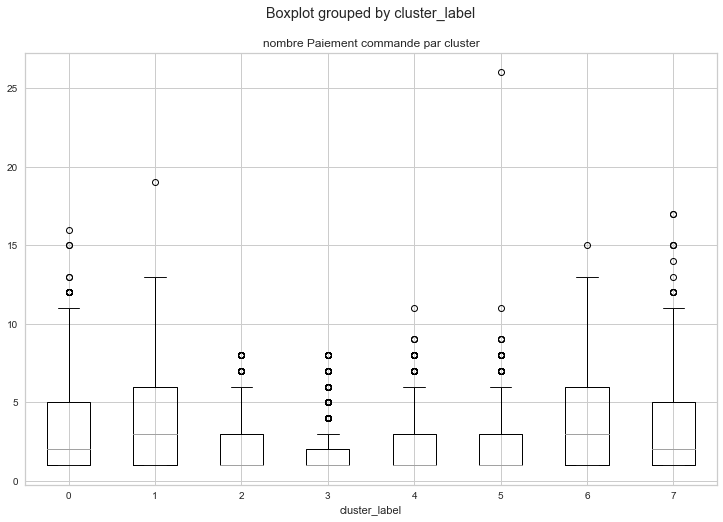

In [187]:
data_cluster.boxplot('nb_paye_par_commande', by='cluster_label',  figsize=(12, 8))
plt.title('nombre Paiement commande par cluster')
plt.savefig('P2_13_nbpaie_cluster.jpg')
plt.show()

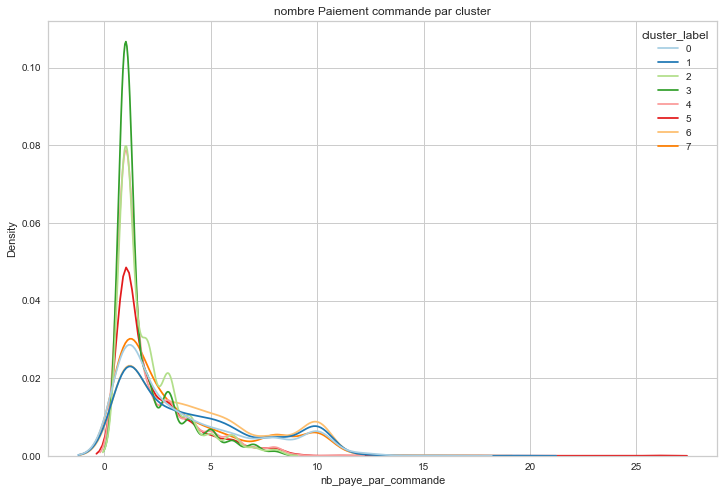

In [188]:
plt.figure(figsize=(12, 8))
sns.kdeplot(x='nb_paye_par_commande', data = data_cluster, hue = 'cluster_label', palette = 'Paired')
plt.title('nombre Paiement commande par cluster')
plt.savefig('P2_14_Dist_nbpaie_cluster.jpg')
plt.show()

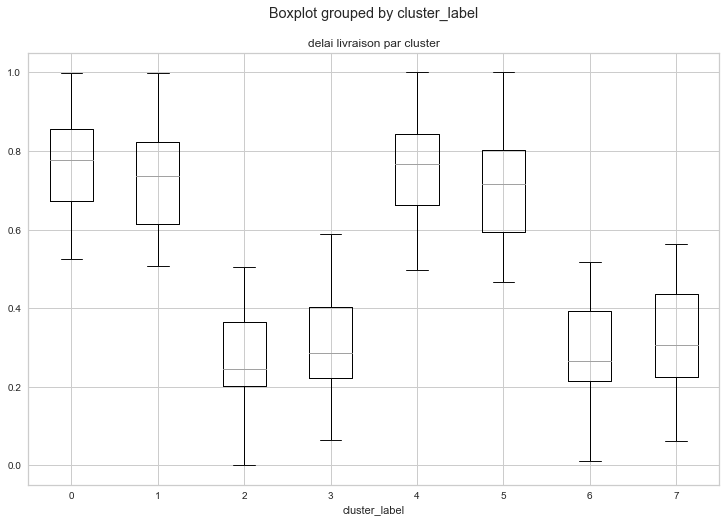

In [190]:
data_cluster.boxplot('delai_jours', by='cluster_label',  figsize=(12, 8))
plt.title('delai livraison par cluster')
plt.savefig('P2_15_delai_cluster.jpg')
plt.show()

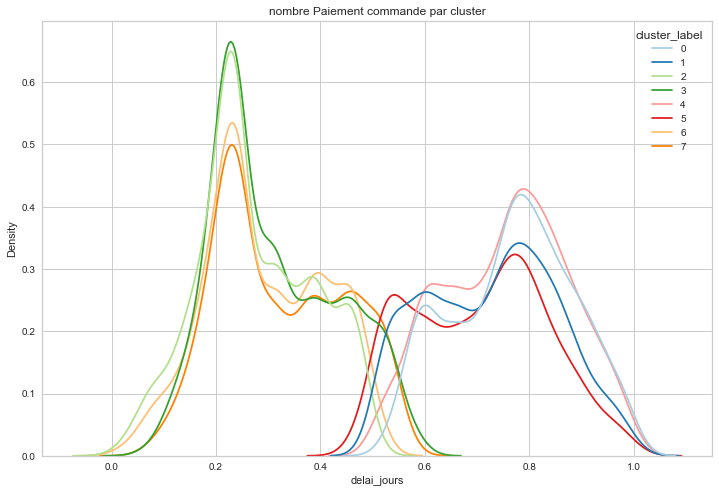

In [191]:
plt.figure(figsize=(12, 8))
sns.kdeplot(x='delai_jours', data = data_cluster, hue = 'cluster_label', palette = 'Paired')
plt.title('nombre Paiement commande par cluster')
plt.savefig('P2_16_Dist_delai_cluster.jpg')
plt.show()

In [193]:
data_cluster

,paye_par_commande,delai_jours,date_commande,nb_paye_par_commande,cluster_label
0,0.744730,0.382890,0.354839,2,6
21,0.544095,0.962808,0.395161,2,1
26,0.502707,0.229611,0.579545,1,3
30,0.220340,0.159499,0.362903,1,2
37,0.863271,0.792090,0.125000,8,1
...,...,...,...,...,...
99420,0.311699,0.706843,0.927536,1,4
99424,0.544095,0.243069,0.362903,1,6
99428,0.681055,0.310620,0.681818,1,7
99430,0.544095,0.403898,0.290323,1,6


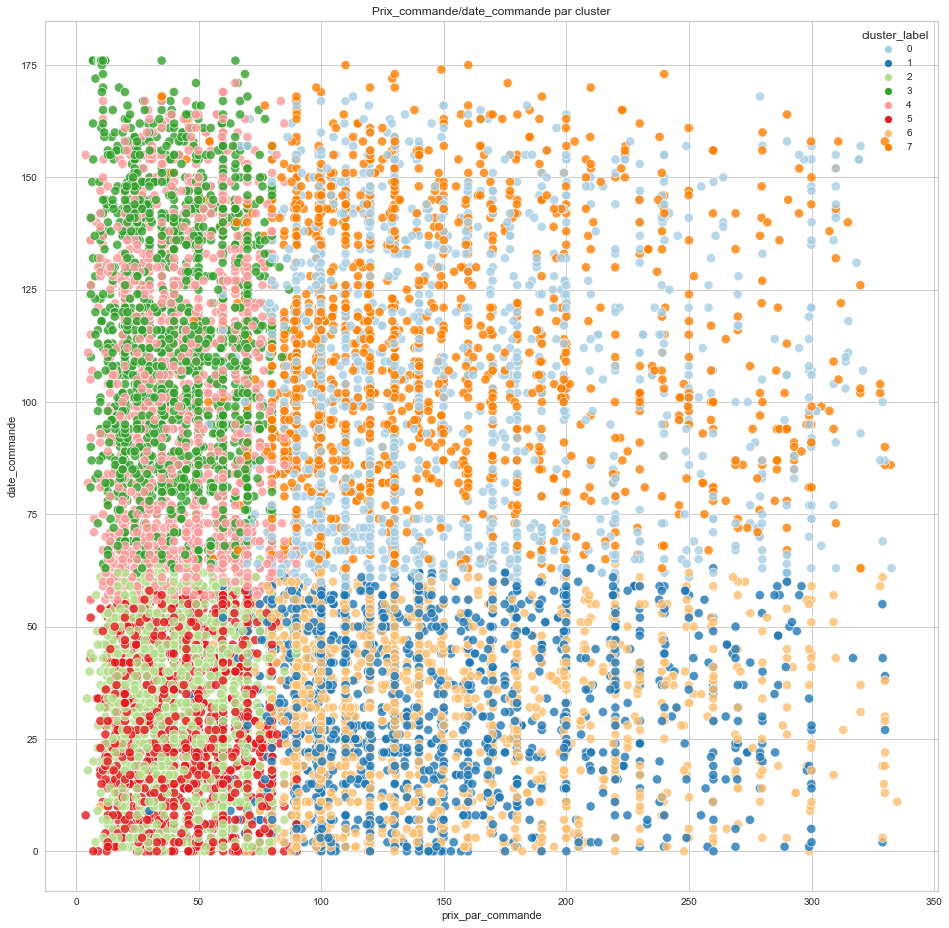

In [194]:
df_trim['cluster_label'] = km.labels_
df_trim['cluster_label'] = df_trim['cluster_label'].astype('category')
plt.figure(figsize=(16,16))
sns.scatterplot(data=df_trim, x='prix_par_commande', y='date_commande',
                hue='cluster_label', s=85, alpha=0.8, palette='Paired')
plt.title('Prix_commande/date_commande par cluster')
plt.savefig('P2_19_prix_date_cluster.jpg')
plt.show()

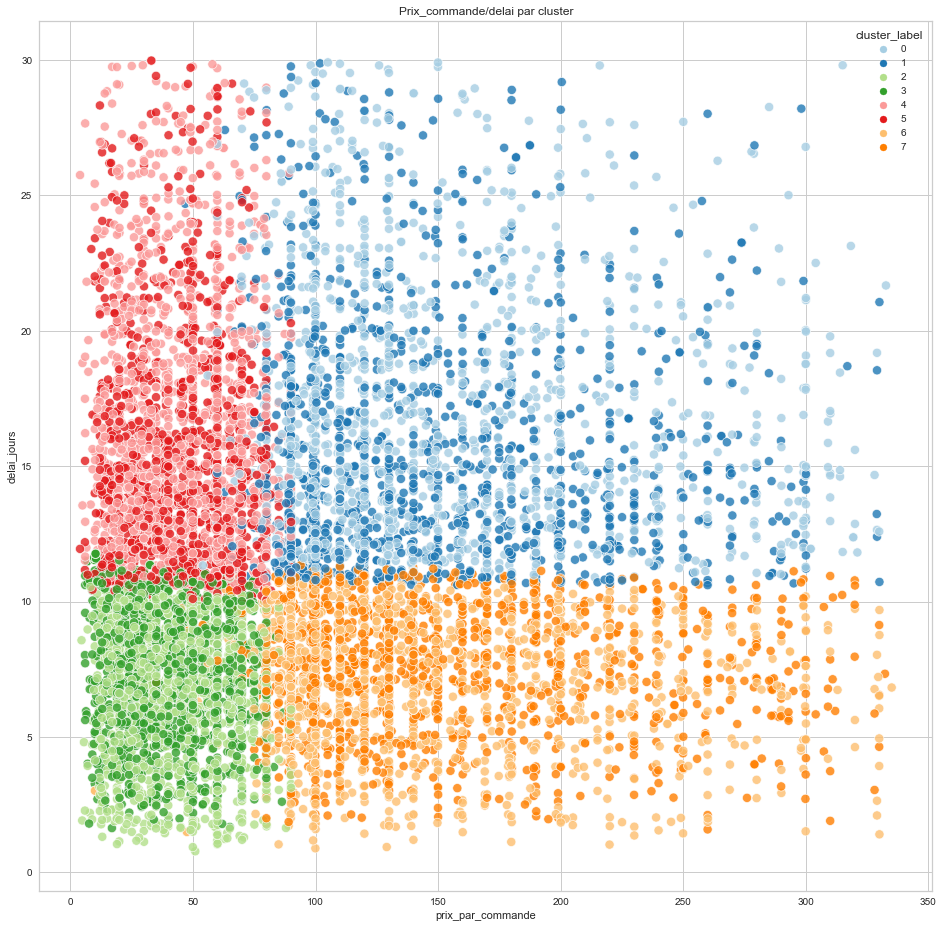

In [195]:
plt.figure(figsize=(16,16))
sns.scatterplot(data=df_trim, x='prix_par_commande', y='delai_jours',
                hue='cluster_label', s=85, alpha=0.8, palette='Paired')
plt.title('Prix_commande/delai par cluster')
plt.savefig('P2_19_prix_delai_cluster.jpg')
plt.show()

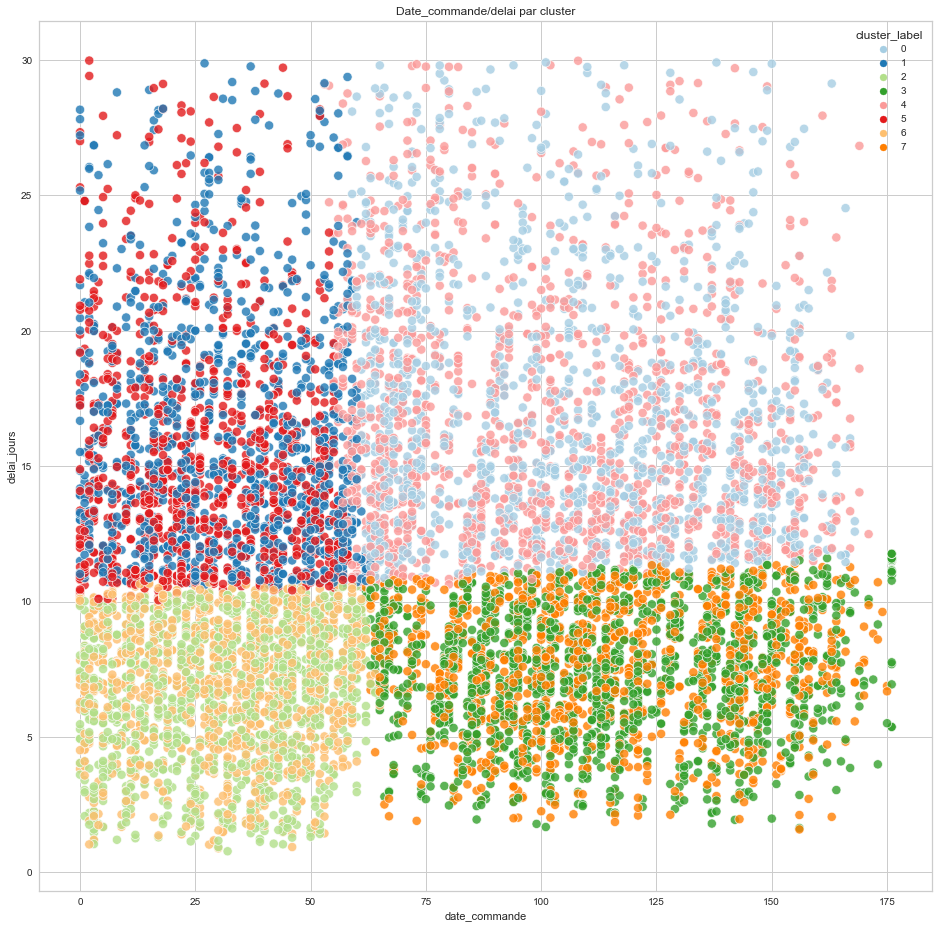

In [196]:
plt.figure(figsize=(16,16))
sns.scatterplot(data=df_trim, x='date_commande', y='delai_jours',
                hue='cluster_label', s=85, alpha=0.8, palette='Paired')
plt.title('Date_commande/delai par cluster')
plt.savefig('P2_19_date_delai_cluster.jpg')
plt.show()

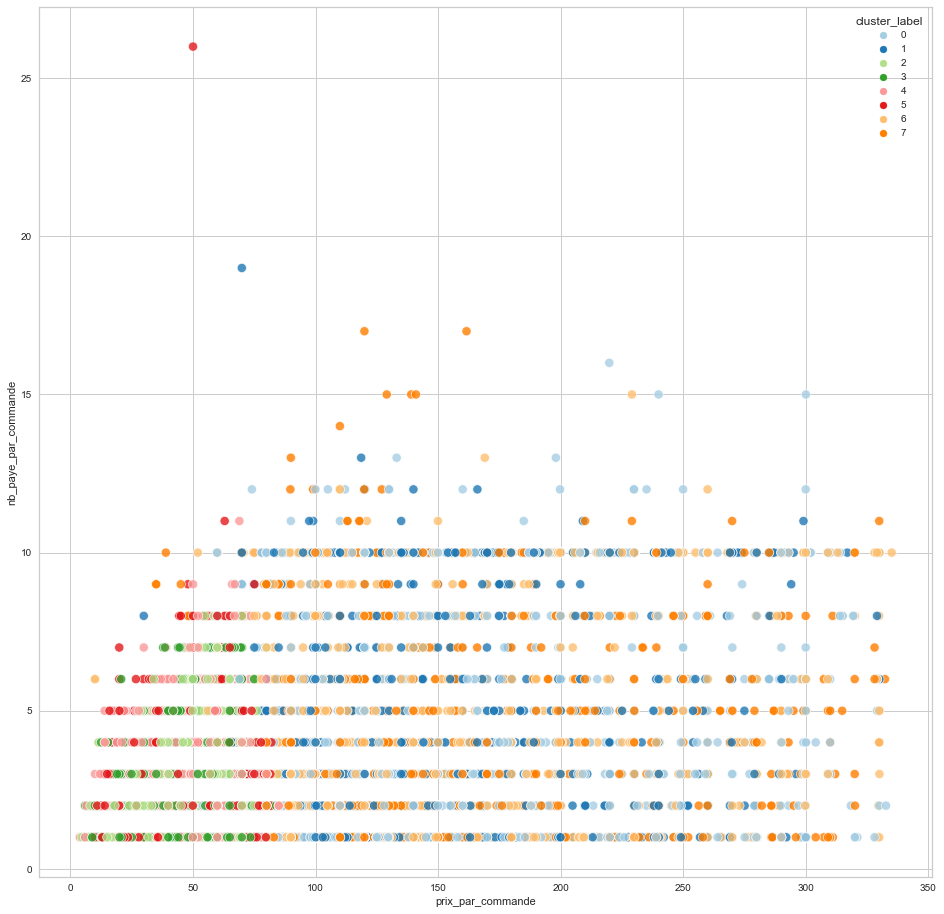

In [197]:
plt.figure(figsize=(16,16))
sns.scatterplot(data=df_trim, x='prix_par_commande', y='nb_paye_par_commande',
                hue='cluster_label', s=85, alpha=0.8, palette='Paired')
plt.show()

<Figure size 864x576 with 0 Axes>

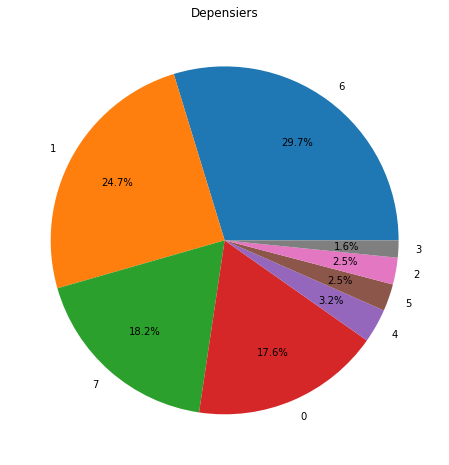

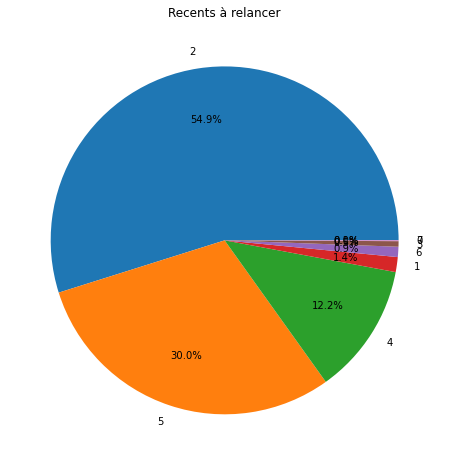

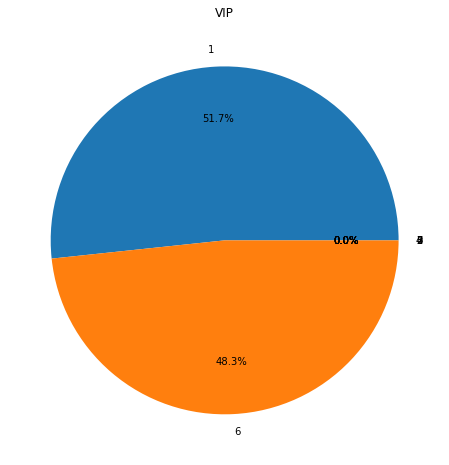

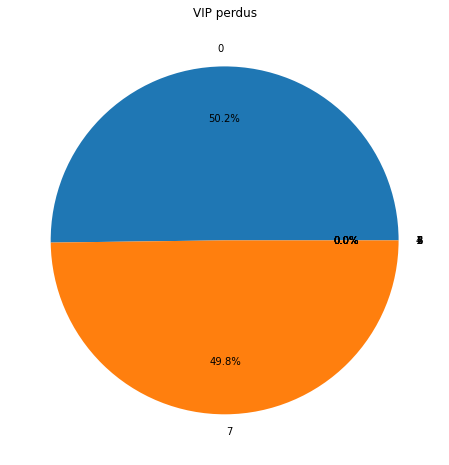

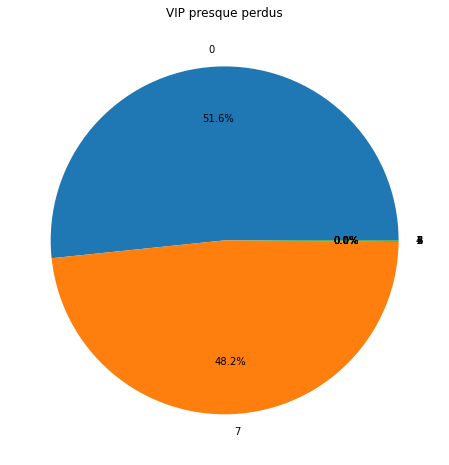

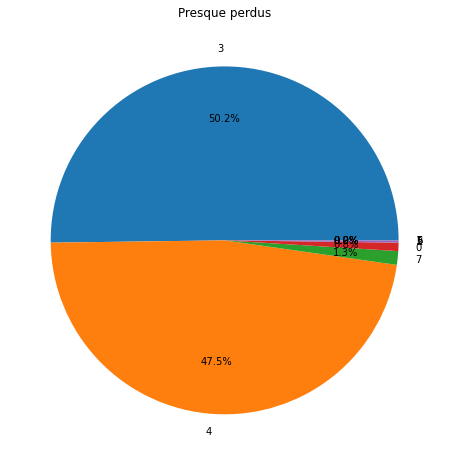

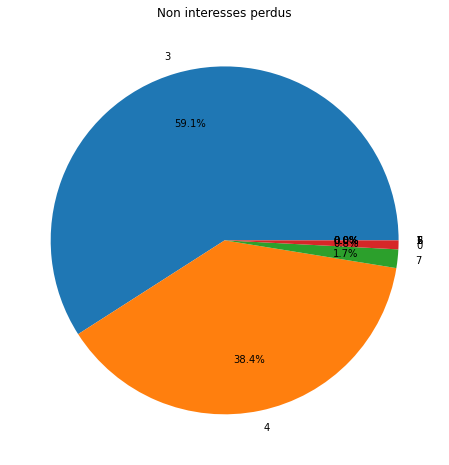

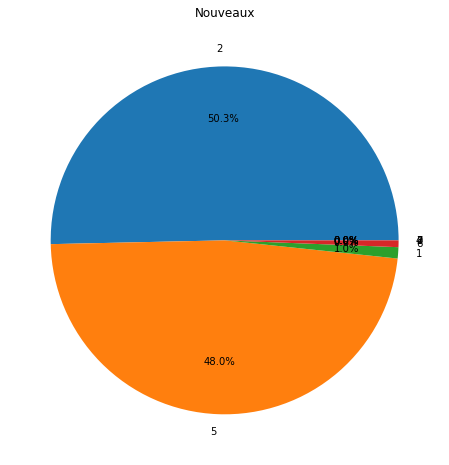

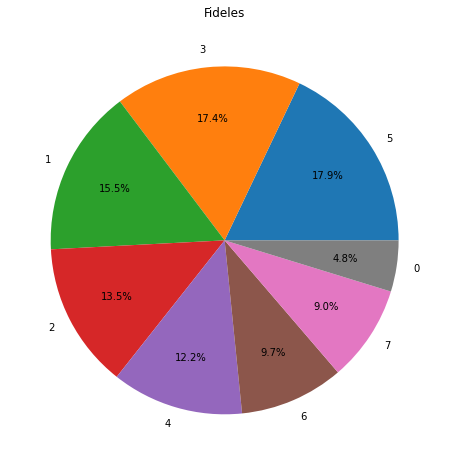

In [132]:
for classRFM in df_trim['class_RFM'].unique():
    plt.figure(figsize=(12, 8))
    note_pie = df_trim.loc[(df_trim.class_RFM==classRFM), 'cluster_label'].value_counts()
    plt.title(classRFM)
    plt.pie(note_pie, labels= note_pie.index, autopct='%1.1f%%', pctdistance=0.7)
    plt.show()

In [172]:
df_trim.loc[(df_trim['cluster_label']==6), 'cluster_STR'] = 'DEPENS_RECEN_NOTE+'
df_trim.loc[(df_trim['cluster_label']==1), 'cluster_STR'] = 'DEPENS_RECEN_NOTE-'
df_trim.loc[(df_trim['cluster_label']==7), 'cluster_STR'] = 'DEPENS_VIEUX_NOTE+'
df_trim.loc[(df_trim['cluster_label']==0), 'cluster_STR'] = 'DEPENS_VIEUX_NOTE-'
df_trim.loc[(df_trim['cluster_label']==2), 'cluster_STR'] = 'PETITE_RECEN_NOTE+'
df_trim.loc[(df_trim['cluster_label']==5), 'cluster_STR'] = 'PETITE_RECEN_NOTE-'
df_trim.loc[(df_trim['cluster_label']==3), 'cluster_STR'] = 'PETITE_VIEUX_NOTE+'
df_trim.loc[(df_trim['cluster_label']==4), 'cluster_STR'] = 'PETITE_VIEUX_NOTE-+'


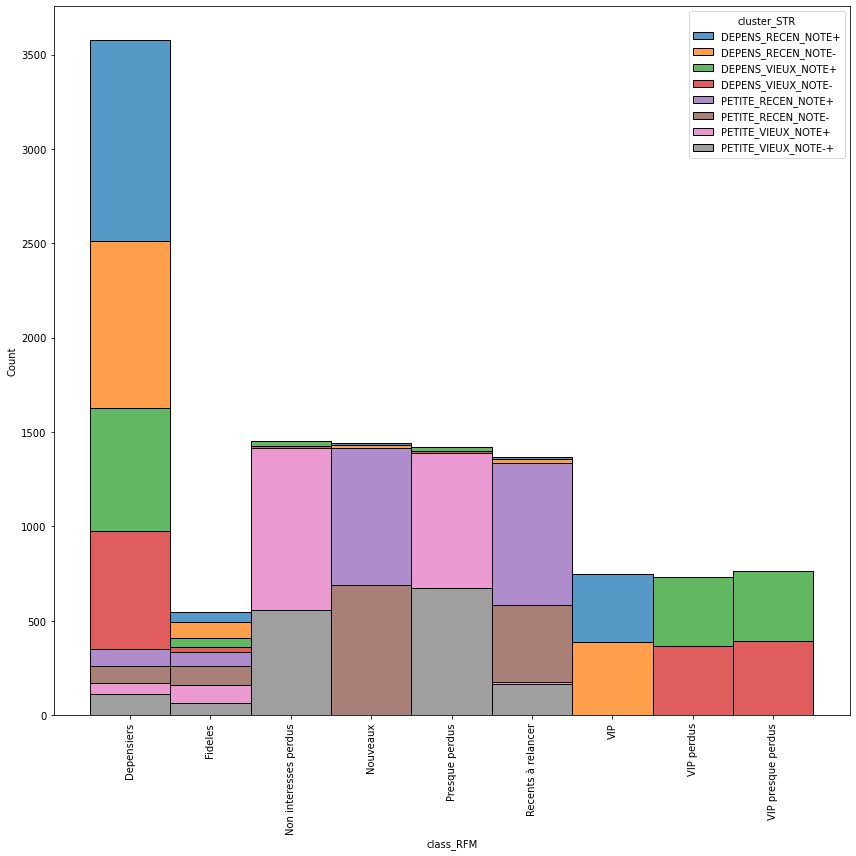

In [181]:
plt.figure(figsize=(12, 12))
df_trim['cluster_STR'] = df_trim['cluster_STR'].astype('category')
sns.histplot(x ='class_RFM', hue='cluster_STR', data=df_trim, multiple="stack")
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('P2_21_class_RFM-cluster.jpg')
plt.show()

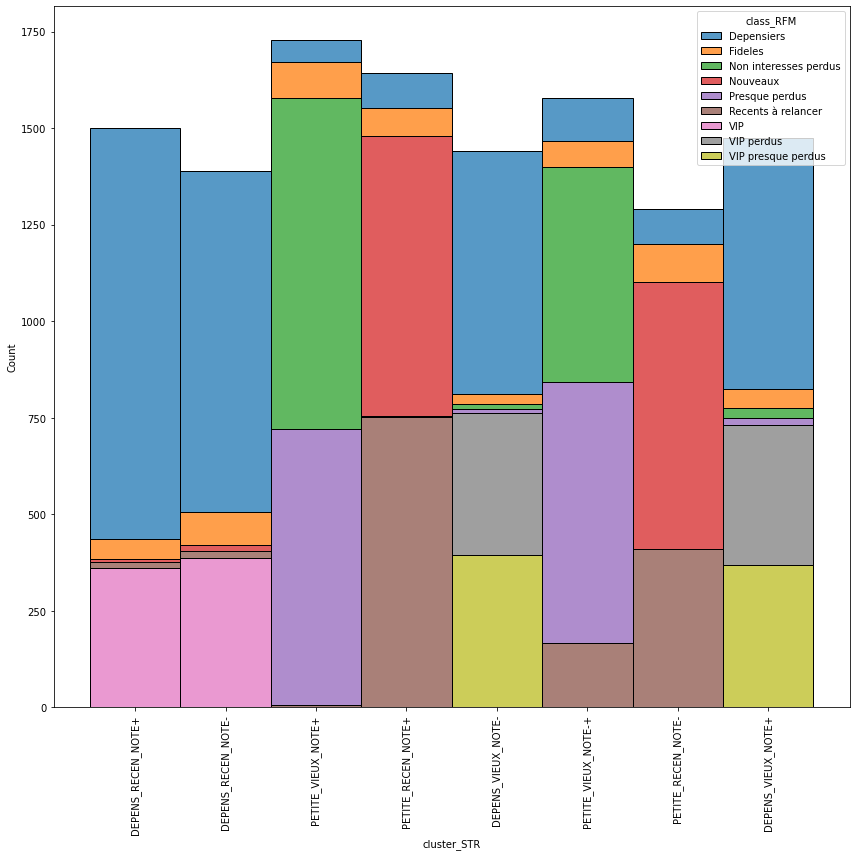

In [182]:
plt.figure(figsize=(12,12))
df_trim['cluster_STR'] = df_trim['cluster_STR'].astype('object')
sns.histplot(x ='cluster_STR', hue='class_RFM', data=df_trim, multiple="stack")
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('P2_21_cluster-class_RFM.jpg')
plt.show()

# Stabilité cluster

In [7]:
date_debut = pd.to_datetime('2017-01-01')
date_fin = date_debut + pd.Timedelta(days=180)

filter_date = (data_test.date_derniere_commande>date_debut) &  (data_test.date_derniere_commande<date_fin) 
df_trim = data_test[filter_date].copy()


In [10]:
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

data_cluster = df_trim[['paye_par_commande', 'delai_jours', 'date_commande', 'nb_paye_par_commande']].copy()

data_cluster.paye_par_commande = np.log1p(data_cluster.paye_par_commande)
data_cluster.delai_jours = np.log1p(data_cluster.delai_jours)

data_cluster['paye_par_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['paye_par_commande']).reshape(-1, 1))
data_cluster['date_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['date_commande']).reshape(-1, 1))
data_cluster['delai_jours'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['delai_jours']).reshape(-1, 1))

X_std = MinMaxScaler().fit_transform(data_cluster)

dict_km={}

for i in range(1,51):
    km = KMeans(n_clusters=8)
    km.fit(X_std)
    dict_km[i] = km.labels_
    
stab_clust = []
for cle in dict_km.keys():
    for i in range(cle+1,51):
        ari = adjusted_rand_score(dict_km[cle], dict_km[i])
        stab_clust.append(ari)
#        print(cle,i, ari)

print('ARI moyen : ', np.array(stab_clust).mean())

ARI moyen :  0.9895146486758711


In [22]:
#initialisation k-means++ et init = 1

dict_km={}

for i in range(1,51):
    km = KMeans(n_clusters=8, init='k-means++', n_init=1)
    km.fit(X_std)
    dict_km[i] = km.labels_
    
stab_clust = []
for cle in dict_km.keys():
    for i in range(cle+1,51):
        ari = adjusted_rand_score(dict_km[cle], dict_km[i])
        stab_clust.append(ari)
#        print(cle,i, ari)

print('ARI moyen : ', np.array(stab_clust).mean())

ARI moyen :  0.9688082866447942


In [20]:
#initialisation random et init = 1

dict_km={}

for i in range(1,51):
    km = KMeans(n_clusters=8, init='random', n_init=1)
    km.fit(X_std)
    dict_km[i] = km.labels_
    
stab_clust = []
for cle in dict_km.keys():
    for i in range(cle+1,51):
        ari = adjusted_rand_score(dict_km[cle], dict_km[i])
        stab_clust.append(ari)
#        print(cle,i, ari)

print('ARI moyen : ', np.array(stab_clust).mean())

ARI moyen :  0.9574162632861589


# contrat maintenance cluster

In [230]:
# entrainement du premier modele
date_fin = pd.to_datetime('2018-05-31')
date_debut = date_fin - pd.Timedelta(days=180)

filter_date = (data_test.date_derniere_commande>date_debut) &  (data_test.date_derniere_commande<date_fin) 
df_trim = data_test[filter_date].copy()

data_cluster = df_trim[['paye_par_commande', 'delai_jours', 'date_commande', 'nb_paye_par_commande']].copy()

data_cluster.paye_par_commande = np.log1p(data_cluster.paye_par_commande)
data_cluster.delai_jours = np.log1p(data_cluster.delai_jours)

data_cluster['paye_par_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['paye_par_commande']).reshape(-1, 1))
data_cluster['date_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['date_commande']).reshape(-1, 1))
data_cluster['delai_jours'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['delai_jours']).reshape(-1, 1))

X_std = MinMaxScaler().fit_transform(data_cluster)

km = KMeans(n_clusters=8)
km.fit(X_std)
data_cluster['cluster'] = km.labels_

In [231]:
# creation du jeu de test et premiere prediction
date_debut = pd.to_datetime('2018-06-01')
date_fin = pd.to_datetime('2018-06-30')

filter_date = (data_test.date_derniere_commande>date_debut) &  (data_test.date_derniere_commande<date_fin) 
df_trim = data_test[filter_date].copy()

data_cluster = df_trim[['paye_par_commande', 'delai_jours', 'date_commande', 'nb_paye_par_commande']].copy()

data_cluster.paye_par_commande = np.log1p(data_cluster.paye_par_commande)
data_cluster.delai_jours = np.log1p(data_cluster.delai_jours)

data_cluster['paye_par_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['paye_par_commande']).reshape(-1, 1))
data_cluster['date_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['date_commande']).reshape(-1, 1))
data_cluster['delai_jours'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster['delai_jours']).reshape(-1, 1))

X_std = MinMaxScaler().fit_transform(data_cluster)
data_cluster['cluster'] = km.predict(X_std)

1 2017-11-02 00:00:00 2018-05-01 00:00:00 0.8543642580763104
2 2017-10-03 00:00:00 2018-04-01 00:00:00 0.8386596843293237
3 2017-09-03 00:00:00 2018-03-02 00:00:00 0.8201427101247417
4 2017-08-04 00:00:00 2018-01-31 00:00:00 0.7522281275091861
5 2017-07-05 00:00:00 2018-01-01 00:00:00 0.8084442680004528
6 2017-06-05 00:00:00 2017-12-02 00:00:00 0.8133061863232353
7 2017-05-06 00:00:00 2017-11-02 00:00:00 0.8857541744917038
8 2017-04-06 00:00:00 2017-10-03 00:00:00 0.8914106341835946
9 2017-03-07 00:00:00 2017-09-03 00:00:00 0.9069856314417319
10 2017-02-05 00:00:00 2017-08-04 00:00:00 0.9012400243077117
11 2017-01-06 00:00:00 2017-07-05 00:00:00 0.8851320140752732
12 2016-12-07 00:00:00 2017-06-05 00:00:00 0.8468605190539484
13 2016-11-07 00:00:00 2017-05-06 00:00:00 0.7819666477324625
14 2016-10-08 00:00:00 2017-04-06 00:00:00 0.8571370112080523


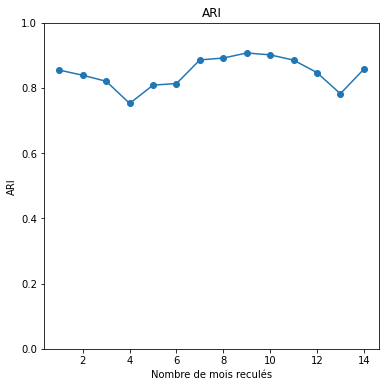

In [234]:
from sklearn.metrics.cluster import adjusted_rand_score

date_fin = pd.to_datetime('2018-05-31')
date_debut = date_fin - pd.Timedelta(days=180)

ARI = []
for i in range(1,15):
    date_new = date_debut - pd.Timedelta(days=30*i)
    date_new_fin = date_new + pd.Timedelta(days=180)

    filter_date = (data_test.date_derniere_commande>date_new) &  (data_test.date_derniere_commande<date_new_fin) 
    df_trim = data_test[filter_date].copy()

    data_cluster_range = df_trim[['paye_par_commande', 'delai_jours', 'date_commande', 'nb_paye_par_commande']].copy()

    data_cluster_range.paye_par_commande = np.log1p(data_cluster_range.paye_par_commande)
    data_cluster_range.delai_jours = np.log1p(data_cluster_range.delai_jours)

    data_cluster_range['paye_par_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster_range['paye_par_commande']).reshape(-1, 1))
    data_cluster_range['date_commande'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster_range['date_commande']).reshape(-1, 1))
    data_cluster_range['delai_jours'] = QuantileTransformer(n_quantiles=5).fit_transform(np.array(data_cluster_range['delai_jours']).reshape(-1, 1))

    X_std_range = MinMaxScaler().fit_transform(data_cluster_range)
   
    km_range = KMeans(n_clusters=8)
    km_range.fit(X_std_range)
    
    data_cluster['cluster_predit'] = km_range.predict(X_std)


    sc_ari = adjusted_rand_score(data_cluster['cluster_predit'], data_cluster['cluster'])
    print(i, date_new, date_new_fin, sc_ari)
    ARI.append(sc_ari)
    
plt.figure(figsize=(6,6))
plt.plot(range(1, 15), ARI, marker = 'o')
plt.title('ARI')
plt.xlabel('Nombre de mois reculés')
plt.ylabel('ARI')
plt.ylim((0,1))
plt.savefig('P2_14_ARI_maintenance.jpg')
plt.show()    